# Cyclone Oceanic Response Analysis: Scale Decomposition

**Cyclones Analyzed:** Remal (May 2024) & Dana (October 2024)

**Data Sources:**
- SST: GHRSST MUR-JPL-L4-GLOB-v4.1 (0.01° resolution)
- MSLA: CMEMS SEALEVEL_GLO_PHY_L4_MY_008_047 (0.125Â° resolution)

**Phases:**
1. Date-wise Data Inventory & First-look Plots
2. 2D Gaussian Filter for Scale Separation
3. Scale-wise Visual Comparison
4. Cyclone Response by Scale 

In [ ]:
import os
import glob
import re
import warnings
from datetime import datetime, timedelta
from math import ceil

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.colors import Normalize, TwoSlopeNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.ndimage import gaussian_filter

warnings.filterwarnings('ignore')
plt.rcParams.update({'figure.dpi': 120, 'savefig.dpi': 150})

print('Libraries loaded successfully!')

In [ ]:
# =============================================================================
# DATA PATHS
# =============================================================================
SST_DATA_DIR = r"C:\Users\abhik\Downloads\New_folder\MUR-JPL-L4-GLOB-v4.1_4.1-20260316_132446"
MSLA_ROOT_DIR = os.path.join(
    r"C:\Users\abhik\Downloads",
    "SEALEVEL_GLO_PHY_L4_MY_008_047 "
    "cmems_obs-sl_glo_phy-ssh_my_allsat-l4-duacs-0.125deg_P1D 2024 01",
)

OUTPUT_DIR = r"C:\Users\abhik\Desktop\project related work\Cyclone_Analysis_Outputs_newscale_500large"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# =============================================================================
# CYCLONE DEFINITIONS
# =============================================================================
# Track data sourced from IMD/JTWC Best Track Archives

CYCLONES = {
    'REMAL': {
        'name': 'Severe Cyclonic Storm Remal',
        'category': 'SCS (Cat-1 equivalent)',
        'max_wind_kt': 75,  # knots
        'min_pressure_hPa': 978,
        'dates': {
            'formation': '2024-05-24',
            'peak': '2024-05-26',
            'landfall': '2024-05-27',
            'dissipation': '2024-05-28',
        },
        # Best Track Coordinates (lon, lat, date, wind_kt, pressure_hPa)
        'track': [
            (88.0, 15.5, '2024-05-23 00:00', 25, 1004),
            (87.8, 16.2, '2024-05-23 12:00', 30, 1002),
            (87.5, 17.0, '2024-05-24 00:00', 35, 1000),
            (87.3, 17.8, '2024-05-24 12:00', 45, 996),
            (87.2, 18.5, '2024-05-25 00:00', 55, 990),
            (87.5, 19.2, '2024-05-25 12:00', 60, 985),
            (88.0, 19.8, '2024-05-26 00:00', 70, 980),
            (88.5, 20.5, '2024-05-26 12:00', 75, 978),
            (89.0, 21.2, '2024-05-27 00:00', 65, 984),
            (89.3, 21.8, '2024-05-27 12:00', 50, 990),
            (89.5, 22.5, '2024-05-28 00:00', 35, 996),
        ],
        'bbox': {'lon_min': 84, 'lon_max': 94, 'lat_min': 13, 'lat_max': 25},
        'analysis_dates': {
            'pre': ('2024-05-19', '2024-05-23'),
            'during': ('2024-05-24', '2024-05-27'),
            'post': ('2024-05-28', '2024-06-06'),
        },
    },
    'DANA': {
        'name': 'Severe Cyclonic Storm Dana',
        'category': 'SCS (Cat-1 equivalent)',
        'max_wind_kt': 75,  # knots
        'min_pressure_hPa': 972,
        'dates': {
            'formation': '2024-10-23',
            'peak': '2024-10-24',
            'landfall': '2024-10-25',
            'dissipation': '2024-10-25',
        },
        # Best Track Coordinates (lon, lat, date, wind_kt, pressure_hPa)
        'track': [
            (87.5, 15.0, '2024-10-22 00:00', 25, 1006),
            (87.2, 15.8, '2024-10-22 12:00', 30, 1004),
            (87.0, 16.5, '2024-10-23 00:00', 40, 1000),
            (86.8, 17.2, '2024-10-23 12:00', 50, 992),
            (86.5, 18.0, '2024-10-24 00:00', 65, 980),
            (86.8, 18.8, '2024-10-24 12:00', 75, 972),
            (87.2, 19.5, '2024-10-25 00:00', 70, 976),
            (87.5, 20.2, '2024-10-25 06:00', 55, 988),
            (87.8, 20.8, '2024-10-25 12:00', 40, 996),
        ],
        'bbox': {'lon_min': 82, 'lon_max': 92, 'lat_min': 12, 'lat_max': 24},
        'analysis_dates': {
            'pre': ('2024-10-17', '2024-10-22'),
            'during': ('2024-10-23', '2024-10-25'),
            'post': ('2024-10-26', '2024-11-04'),
        },
    },
}

# # MSLA-specific filter scales (adapted for 0.125° / pixel grid)
# # MSLA grid is 2.5x coarser than SST, so sigma in grid points
# # must be larger to stay above Nyquist (min ~4 grid pts)
# # nyquist = the minimum rate at which a signal can be sampled without introducing errors, which is twice the highest frequency present in the signal.
# FILTER_SCALES_MSLA = {
#     'submeso': 0.5,   # degrees (~55 km) -> sigma=4.0 for MSLA
#     'meso': 1.5,      # degrees (~165 km) -> sigma=12.0 for MSLA
#     'large': 3.5,     # degrees (~390 km) -> sigma=28.0 for MSLA
# }

# # =============================================================================
# # GAUSSIAN FILTER SCALES

# FILTER_SCALES = {
#     'submeso': 0.2,     # degrees (~20 km) -> sigma~4 for SST, 
#     'meso': 0.8,        # degrees (~80 km) -> sigma~16 for SST,
#     'large': 2.5,       # degrees (~250 km) -> sigma~50 for SST, 
# }

# # Plot settings
# SST_VMIN, SST_VMAX = 28.0, 35.0
# SLA_VMIN, SLA_VMAX = -0.2, 0.2

print('Configuration loaded:')
for cyc_name, cyc_info in CYCLONES.items():
    print(f"  {cyc_name}: {cyc_info['dates']['formation']} to {cyc_info['dates']['dissipation']}")

Configuration loaded:
  REMAL: 2024-05-24 to 2024-05-28
  DANA: 2024-10-23 to 2024-10-25


---
# PHASE 1: Date-wise Data Inventory & First-look Plots

## 1.1 Cyclone Track Summary

In [7]:
def print_cyclone_summary():
    """Print comprehensive summary of both cyclones."""
    print("=" * 80)
    print("CYCLONE INVENTORY FOR BAY OF BENGAL 2024")
    print("=" * 80)
    
    for cyc_name, cyc in CYCLONES.items():
        print(f"\n{'=' * 40}")
        print(f"CYCLONE: {cyc['name']}")
        print(f"{'=' * 40}")
        print(f"Category: {cyc['category']}")
        print(f"Max Wind: {cyc['max_wind_kt']} kt | Min Pressure: {cyc['min_pressure_hPa']} hPa")
        print(f"")
        print(f"KEY DATES:")
        for key, date in cyc['dates'].items():
            print(f"  {key.capitalize():12} : {date}")
        print(f"")
        print(f"ANALYSIS BOUNDING BOX:")
        bb = cyc['bbox']
        print(f"  Longitude: {bb['lon_min']} °E to {bb['lon_max']} °E")
        print(f"  Latitude:  {bb['lat_min']} °N to {bb['lat_max']} °N")
        print(f"")
        print(f"ANALYSIS PERIODS:")
        for phase, (start, end) in cyc['analysis_dates'].items():
            print(f"  {phase.capitalize():8} : {start} to {end}")
        print(f"")
        print(f"TRACK POSITIONS ({len(cyc['track'])} points):")
        print(f"  {'Date/Time':<18} {'Lon':>8} {'Lat':>8} {'Wind':>8} {'Pres':>8}")
        for lon, lat, dt, wind, pres in cyc['track']:
            print(f"  {dt:<18} {lon:>8.1f} {lat:>8.1f} {wind:>6} kt {pres:>6} hPa")
    
    print(f"\n{'=' * 80}")

print_cyclone_summary()

CYCLONE INVENTORY FOR BAY OF BENGAL 2024

CYCLONE: Severe Cyclonic Storm Remal
Category: SCS (Cat-1 equivalent)
Max Wind: 75 kt | Min Pressure: 978 hPa

KEY DATES:
  Formation    : 2024-05-24
  Peak         : 2024-05-26
  Landfall     : 2024-05-27
  Dissipation  : 2024-05-28

ANALYSIS BOUNDING BOX:
  Longitude: 84 °E to 94 °E
  Latitude:  13 °N to 25 °N

ANALYSIS PERIODS:
  Pre      : 2024-05-19 to 2024-05-23
  During   : 2024-05-24 to 2024-05-27
  Post     : 2024-05-28 to 2024-06-06

TRACK POSITIONS (11 points):
  Date/Time               Lon      Lat     Wind     Pres
  2024-05-23 00:00       88.0     15.5     25 kt   1004 hPa
  2024-05-23 12:00       87.8     16.2     30 kt   1002 hPa
  2024-05-24 00:00       87.5     17.0     35 kt   1000 hPa
  2024-05-24 12:00       87.3     17.8     45 kt    996 hPa
  2024-05-25 00:00       87.2     18.5     55 kt    990 hPa
  2024-05-25 12:00       87.5     19.2     60 kt    985 hPa
  2024-05-26 00:00       88.0     19.8     70 kt    980 hPa
  20

## 1.2 Data Loading Functions

In [33]:
def extract_date_from_sst_filename(filepath):
    """Parse YYYYMMDD from SST filename."""
    filename = os.path.basename(filepath)
    match = re.match(r'^(\d{8})', filename)
    if match:
        return datetime.strptime(match.group(1), '%Y%m%d')
    raise ValueError(f"Cannot parse date from: {filename}")


def load_sst_for_date(date, region, downsample=5):
    """
    Load SST data for a specific date.
    
    Parameters
    ----------
    date : datetime or str
        Date to load (YYYY-MM-DD format if string)
    region : dict
        {lon_min, lon_max, lat_min, lat_max}
    downsample : int
        Spatial subsampling factor
    
    Returns
    -------
    xr.DataArray : SST in degrees Celsius
    """
    if isinstance(date, str):
        date = datetime.strptime(date, '%Y-%m-%d')
    
    date_str = date.strftime('%Y%m%d')
    pattern = os.path.join(SST_DATA_DIR, f"{date_str}*.nc")
    files = glob.glob(pattern)
    
    if not files:
        return None
    
    ds = xr.open_dataset(files[0])
    sst = ds['analysed_sst'].squeeze('time')
    
    # Subset to region
    sst = sst.sel(
        lon=slice(region['lon_min'], region['lon_max']),
        lat=slice(region['lat_min'], region['lat_max'])
    )
    
    # Convert Kelvin to Celsius
    sst = sst - 273.15
    
    # Downsample
    if downsample > 1:
        sst = sst[::downsample, ::downsample]
    
    ds.close()
    return sst


def load_msla_dataset(bbox):
    """
    Load full year MSLA dataset for given bounding box.
    
    Parameters
    ----------
    bbox : dict
        {lon_min, lon_max, lat_min, lat_max}
    
    Returns
    -------
    xr.Dataset
    """
    file_list = []
    for m in range(1, 13):
        pattern = os.path.join(MSLA_ROOT_DIR, f"{m:02d}", "*.nc")
        file_list.extend(sorted(glob.glob(pattern)))
    
    print(f"Loading {len(file_list)} MSLA files...", end=" ", flush=True)
    
    datasets = []
    for fp in file_list:
        d = xr.open_dataset(fp, engine="netcdf4")
        d = d.sel(
            latitude=slice(bbox['lat_min'], bbox['lat_max']),
            longitude=slice(bbox['lon_min'], bbox['lon_max']),
        )
        datasets.append(d.load())
        d.close()
    
    ds = xr.concat(datasets, dim="time")
    print("done.")
    return ds


def get_msla_for_date(ds_msla, date, allow_nearest=True, tolerance_hours=18):
    """
    Extract MSLA field for a specific day.
    Priority:
      1) exact same calendar day in dataset
      2) nearest within tolerance (optional), but only if resulting day matches
    """
    if isinstance(date, str):
        date = datetime.strptime(date, '%Y-%m-%d')

    target_day = pd.Timestamp(date).normalize()
    t = pd.to_datetime(ds_msla.time.values)

    # 1) exact same day
    idx = np.where(t.normalize() == target_day)[0]
    if len(idx) > 0:
        return ds_msla['sla'].isel(time=idx[0])

    # 2) nearest fallback (optional)
    if allow_nearest:
        try:
            sla = ds_msla['sla'].sel(
                time=pd.Timestamp(date),
                method='nearest',
                tolerance=np.timedelta64(tolerance_hours, 'h')
            )
            picked_day = pd.Timestamp(sla.time.values).normalize()
            if picked_day == target_day:
                return sla
        except Exception:
            pass

    return None


print("Data loading functions defined.")

Data loading functions defined.


## 1.3 Load MSLA Dataset

In [34]:
# Load MSLA for full Bay of Bengal (covers both cyclones)
BBOX_FULL = {'lat_min': 5, 'lat_max': 25, 'lon_min': 80, 'lon_max': 100}

ds_msla = load_msla_dataset(BBOX_FULL)
print(f"MSLA dataset loaded: {ds_msla.sizes['time']} time steps")
print(f"Grid: {ds_msla.sizes['latitude']} x {ds_msla.sizes['longitude']}")

Loading 366 MSLA files... 

done.
MSLA dataset loaded: 366 time steps
Grid: 160 x 160


## 1.4 Data Inventory - Check Available Files

In [35]:
# def check_data_availability(cyclone_name):
#     """Check SST and MSLA data availability for a cyclone."""
#     cyc = CYCLONES[cyclone_name]
#     phases = cyc['analysis_dates']
    
#     print(f"\n{'=' * 60}")
#     print(f"DATA AVAILABILITY: {cyclone_name}")
#     print(f"{'=' * 60}")
    
#     all_dates = []
#     for phase, (start, end) in phases.items():
#         start_dt = datetime.strptime(start, '%Y-%m-%d')
#         end_dt = datetime.strptime(end, '%Y-%m-%d')
#         current = start_dt
#         while current <= end_dt:
#             all_dates.append((current, phase))
#             current += timedelta(days=1)
    
#     print(f"\n{'Date':<12} {'Phase':<10} {'SST':<8} {'MSLA':<8}")
#     print("-" * 40)
    
#     sst_count = 0
#     msla_count = 0
    
#     for date, phase in all_dates:
#         # Check SST
#         date_str = date.strftime('%Y%m%d')
#         sst_pattern = os.path.join(SST_DATA_DIR, f"{date_str}*.nc")
#         sst_files = glob.glob(sst_pattern)
#         sst_ok = len(sst_files) > 0
        
#         # Check MSLA
#         try:
#             msla = ds_msla['sla'].sel(time=date.strftime('%Y-%m-%d'), method='nearest')
#             msla_date = pd.Timestamp(msla.time.values).date()
#             msla_ok = msla_date == date.date()
#         except:
#             msla_ok = False
        
#         if sst_ok:
#             sst_count += 1
#         if msla_ok:
#             msla_count += 1
        
#         sst_status = '\u2713' if sst_ok else '\u2717'
#         msla_status = '\u2713' if msla_ok else '\u2717'
        
#         print(f"{date.strftime('%Y-%m-%d'):<12} {phase:<10} {sst_status:<8} {msla_status:<8}")
    
#     print("-" * 40)
#     print(f"Total: {len(all_dates)} days | SST: {sst_count} | MSLA: {msla_count}")
    
#     return all_dates

# # Check availability for both cyclones
# dates_remal = check_data_availability('REMAL')
# dates_dana = check_data_availability('DANA')

## 1.5 Cyclone Track Visualization

In [36]:
# def plot_cyclone_tracks():
#     """Plot both cyclone tracks on a single map."""
#     fig, ax = plt.subplots(
#         figsize=(12, 10),
#         subplot_kw={'projection': ccrs.PlateCarree()}
#     )
    
#     # Map features
#     ax.set_extent([78, 98, 8, 26], crs=ccrs.PlateCarree())
#     ax.add_feature(cfeature.LAND, facecolor='lightgray')
#     ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.3)
#     ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
#     ax.add_feature(cfeature.BORDERS, linestyle='--', linewidth=0.5)
    
#     gl = ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', linestyle='--')
#     gl.top_labels = False
#     gl.right_labels = False
    
#     colors = {'REMAL': 'red', 'DANA': 'blue'}
#     markers = {'REMAL': 'o', 'DANA': 's'}
    
#     for cyc_name, cyc in CYCLONES.items():
#         track = cyc['track']
#         lons = [t[0] for t in track]
#         lats = [t[1] for t in track]
#         winds = [t[3] for t in track]
        
#         # Plot track line
#         ax.plot(lons, lats, '-', color=colors[cyc_name], linewidth=2,
#                 transform=ccrs.PlateCarree(), label=f"{cyc_name} Track")
        
#         # Plot track points (sized by wind speed)
#         for i, (lon, lat, dt, wind, pres) in enumerate(track):
#             size = (wind / 10) ** 1.5 * 5
#             ax.scatter(lon, lat, s=size, c=colors[cyc_name], 
#                       marker=markers[cyc_name], edgecolor='white', linewidth=0.5,
#                       transform=ccrs.PlateCarree(), zorder=5)
            
#             # Add date labels for key points
#             if i == 0 or i == len(track) - 1 or wind == max(winds):
#                 date_label = dt.split()[0][5:]  # MM-DD
#                 ax.annotate(date_label, (lon, lat), xytext=(5, 5),
#                            textcoords='offset points', fontsize=7,
#                            color=colors[cyc_name])
        
#         # Mark peak intensity
#         peak_idx = winds.index(max(winds))
#         ax.scatter(lons[peak_idx], lats[peak_idx], s=200, c='yellow',
#                   marker='*', edgecolor=colors[cyc_name], linewidth=1.5,
#                   transform=ccrs.PlateCarree(), zorder=6)
    
#     ax.legend(loc='upper left', fontsize=10)
#     ax.set_title('Bay of Bengal Cyclone Tracks - 2024\n(Remal: May | Dana: October)',
#                 fontsize=14, fontweight='bold')
    
#     plt.tight_layout()
#     # fig.savefig(os.path.join(OUTPUT_DIR, 'cyclone_tracks_2024.png'), dpi=150, bbox_inches='tight', facecolor='white')
#     plt.show()
#     return fig

# fig_tracks = plot_cyclone_tracks()

## 1.6 First-Look: Side-by-Side SST and MSLA RAW Plots

In [37]:
# def plot_sst_msla_sidebyside(date, cyclone_name, sst_data, msla_data, 
#                               phase_label='', track_data=None):
#     """
#     Create side-by-side SST and MSLA plot with cyclone track overlay.
    
#     Parameters
#     ----------
#     date : datetime
#         Date being plotted
#     cyclone_name : str
#         Cyclone identifier
#     sst_data : xr.DataArray
#         SST field
#     msla_data : xr.DataArray
#         MSLA field
#     phase_label : str
#         'Pre', 'During', or 'Post'
#     track_data : list
#         Cyclone track points
    
#     Returns
#     -------
#     matplotlib.figure.Figure
#     """
#     cyc = CYCLONES[cyclone_name]
#     bbox = cyc['bbox']
    
#     fig, axes = plt.subplots(
#         1, 2, figsize=(16, 7),
#         subplot_kw={'projection': ccrs.PlateCarree()}
#     )
    
#     date_str = date.strftime('%Y-%m-%d')
    
#     # Common map setup function
#     def setup_map(ax, extent):
#         ax.set_extent(extent, crs=ccrs.PlateCarree())
#         ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2)
#         ax.add_feature(cfeature.COASTLINE, linewidth=0.8, zorder=3)
#         ax.add_feature(cfeature.BORDERS, linestyle='--', linewidth=0.5, zorder=3)
#         gl = ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', linestyle='--')
#         gl.top_labels = False
#         gl.right_labels = False
#         gl.xlabel_style = {'size': 8}
#         gl.ylabel_style = {'size': 8}
    
#     extent = [bbox['lon_min'], bbox['lon_max'], bbox['lat_min'], bbox['lat_max']]
    
#     # Plot SST
#     ax = axes[0]
#     setup_map(ax, extent)
#     if sst_data is not None:
#         mesh = ax.pcolormesh(
#             sst_data.lon, sst_data.lat, sst_data.values,
#             transform=ccrs.PlateCarree(),
#             cmap='RdYlBu_r', vmin=SST_VMIN, vmax=SST_VMAX,
#             shading='auto', zorder=0
#         )
#         cbar = plt.colorbar(mesh, ax=ax, orientation='horizontal', 
#                            pad=0.05, shrink=0.8, extend='both')
#         cbar.set_label('SST (\u00b0C)', fontsize=10)
#     else:
#         ax.text(0.5, 0.5, 'No SST Data', transform=ax.transAxes,
#                ha='center', va='center', fontsize=14)
#     ax.set_title(f'{cyclone_name} | {date_str} | SST', fontsize=12, fontweight='bold')
    
#     # Plot MSLA
#     ax = axes[1]
#     setup_map(ax, extent)
#     if msla_data is not None:
#         mesh = ax.pcolormesh(
#             msla_data.longitude, msla_data.latitude, msla_data.values,
#             transform=ccrs.PlateCarree(),
#             cmap='RdBu_r', vmin=SLA_VMIN, vmax=SLA_VMAX,
#             shading='auto', zorder=0
#         )
#         cbar = plt.colorbar(mesh, ax=ax, orientation='horizontal',
#                            pad=0.05, shrink=0.8, extend='both')
#         cbar.set_label('MSLA (m)', fontsize=10)
#     else:
#         ax.text(0.5, 0.5, 'No MSLA Data', transform=ax.transAxes,
#                ha='center', va='center', fontsize=14)
#     ax.set_title(f'{cyclone_name} | {date_str} | MSLA', fontsize=12, fontweight='bold')
    
#     # Overlay cyclone track on both panels
#     if track_data:
#         for ax in axes:
#             lons = [t[0] for t in track_data]
#             lats = [t[1] for t in track_data]
#             ax.plot(lons, lats, 'k-', linewidth=1.5, transform=ccrs.PlateCarree(), zorder=4)
#             ax.scatter(lons, lats, s=20, c='black', marker='o', 
#                       transform=ccrs.PlateCarree(), zorder=5)
            
#             # Mark current date position if available
#             for lon, lat, dt, wind, pres in track_data:
#                 track_date = datetime.strptime(dt.split()[0], '%Y-%m-%d')
#                 if track_date.date() == date.date():
#                     ax.scatter(lon, lat, s=150, c='yellow', marker='*',
#                               edgecolor='black', linewidth=1,
#                               transform=ccrs.PlateCarree(), zorder=6)
    
#     fig.suptitle(f'{phase_label} Cyclone Phase', fontsize=14, y=1.02)
#     plt.tight_layout()
    
#     return fig

# print("Side-by-side plotting function defined.")

## 1.6.1 Generate First-Look Plots for Both Cyclones

  Saved -> C:\Users\abhik\Desktop\project related work\Cyclone_Analysis_Outputs_newscale_500large\REMAL_Panels\REMAL_SST_MSLA_panel.png
  Saved -> C:\Users\abhik\Desktop\project related work\Cyclone_Analysis_Outputs_newscale_500large\DANA_Panels\DANA_SST_MSLA_panel.png


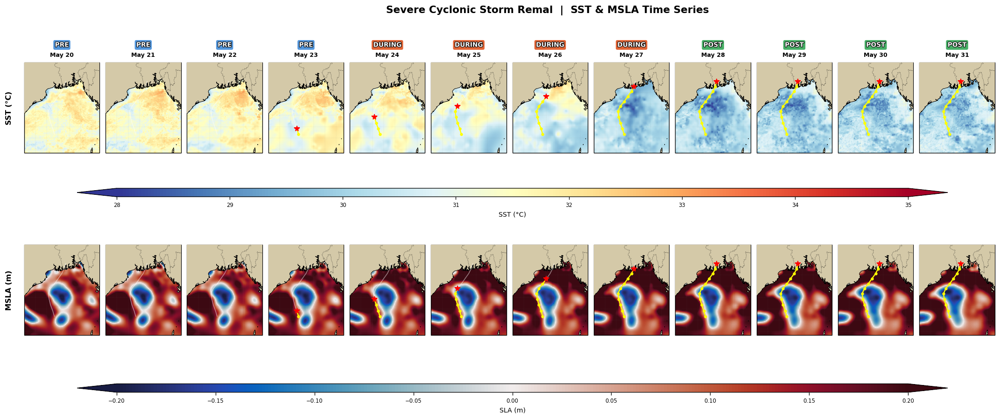

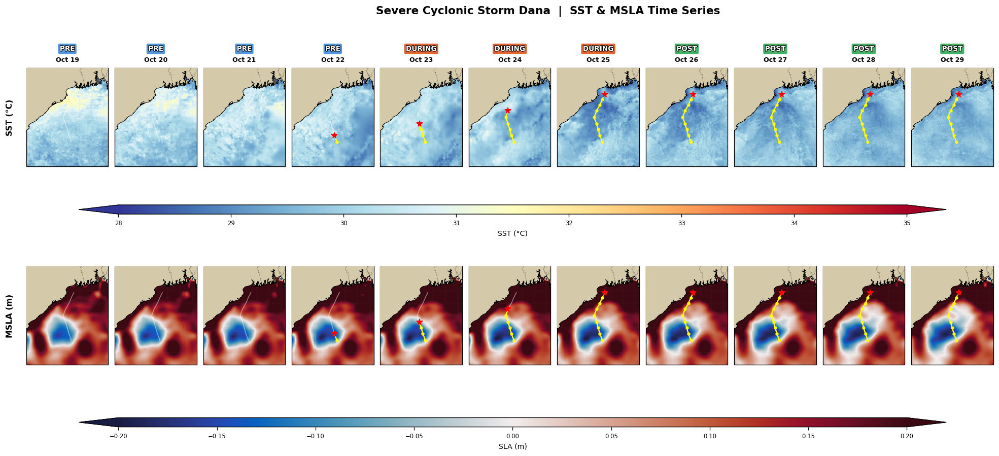

In [ ]:
# import os
# import matplotlib.pyplot as plt
# import matplotlib.gridspec as gridspec
# import matplotlib.patheffects as pe
# import numpy as np
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature
# from datetime import datetime, timedelta
# import cmocean  # optional: pip install cmocean


# # ─────────────────────────────────────────────────────────────────────────────
# # HELPER: one geo-axes panel (SST or MSLA)
# # ─────────────────────────────────────────────────────────────────────────────
# def _draw_panel(ax, data, bbox, cmap, vmin, vmax,
#                 track_data=None, date=None, show_title=''):
#     """Draw a single SST or MSLA panel on a cartopy GeoAxes."""
#     ax.set_extent(
#         [bbox['lon_min'], bbox['lon_max'],
#          bbox['lat_min'], bbox['lat_max']],
#         crs=ccrs.PlateCarree()
#     )
#     ax.add_feature(cfeature.LAND, facecolor='#d4c9a8', zorder=3)
#     ax.add_feature(cfeature.COASTLINE, linewidth=0.6, zorder=4)
#     ax.add_feature(cfeature.BORDERS, linewidth=0.4, linestyle=':', zorder=4)

#     # Keep ticks minimal for dense panel layout
#     gl = ax.gridlines(draw_labels=False, linewidth=0.2, color='gray', alpha=0.25, linestyle='--')

#     if data is not None:
#         lat_name = 'lat' if 'lat' in data.coords else 'latitude'
#         lon_name = 'lon' if 'lon' in data.coords else 'longitude'
#         lons = data[lon_name].values
#         lats = data[lat_name].values
#         vals = data.values

#         im = ax.pcolormesh(
#             lons, lats, vals,
#             cmap=cmap, vmin=vmin, vmax=vmax,
#             transform=ccrs.PlateCarree(),
#             shading='auto', zorder=1
#         )
#     else:
#         im = None
#         ax.text(0.5, 0.5, 'No data', transform=ax.transAxes,
#                 ha='center', va='center', color='gray', fontsize=8)

#     # Draw cyclone track up to current date
#     if track_data and date:
#         track_lons, track_lats, track_dates = [], [], []
#         for entry in track_data:
#             t_lon, t_lat, t_dt_str = entry[0], entry[1], entry[2]
#             t_dt = datetime.strptime(t_dt_str, '%Y-%m-%d %H:%M')
#             track_lons.append(t_lon)
#             track_lats.append(t_lat)
#             track_dates.append(t_dt)

#         # Full track (faint)
#         ax.plot(track_lons, track_lats,
#                 '-', color='white', lw=1.0, alpha=0.45,
#                 transform=ccrs.PlateCarree(), zorder=5)

#         # Track up to this date (highlight)
#         past_lons = [lo for lo, dt in zip(track_lons, track_dates) if dt.date() <= date.date()]
#         past_lats = [la for la, dt in zip(track_lats, track_dates) if dt.date() <= date.date()]
#         if past_lons:
#             ax.plot(past_lons, past_lats,
#                     '-o', color='yellow', lw=1.4, ms=2.8,
#                     transform=ccrs.PlateCarree(), zorder=6)
#             ax.plot(past_lons[-1], past_lats[-1], '*',
#                     color='red', ms=7.0, transform=ccrs.PlateCarree(), zorder=7)

#     if show_title:
#         ax.set_title(show_title, fontsize=7.5, pad=2)

#     return im


# # ─────────────────────────────────────────────────────────────────────────────
# # MAIN: one figure per cyclone
# # ─────────────────────────────────────────────────────────────────────────────
# def generate_cyclone_panel_figure(
#         cyclone_name,
#         phase_date_ranges,
#         ds_msla_full,
#         save_plots=True,
#         output_dir=None):
#     """
#     Generate one multi-panel figure for a cyclone.

#     Layout:
#       2 rows (SST, MSLA) × N columns (one per date)

#     Each column now has:
#       - phase label (PRE/DURING/POST) above date
#       - date label (e.g., May 20)
#     """

#     cyc = CYCLONES[cyclone_name]
#     bbox = cyc['bbox']
#     track = cyc['track']

#     # Build ordered (date, phase) list
#     ordered_cols = []
#     for phase, (start_str, end_str) in phase_date_ranges.items():
#         s = datetime.strptime(start_str, '%Y-%m-%d')
#         e = datetime.strptime(end_str, '%Y-%m-%d')
#         cur = s
#         while cur <= e:
#             ordered_cols.append((cur, phase))
#             cur += timedelta(days=1)

#     n_cols = len(ordered_cols)

#     # Phase color map for per-column labels
#     phase_colors = {
#         'pre': '#4a90d9',
#         'during': '#e05c2a',
#         'post': '#3daa5e'
#     }

#     # Optional cmocean for MSLA
#     cmap_msla = 'RdBu_r'
#     try:
#         import cmocean
#         cmap_msla = cmocean.cm.balance
#     except ImportError:
#         pass

#     # Figure and layout
#     fig_w = max(18, n_cols * 1.75)
#     fig = plt.figure(figsize=(fig_w, 7.6))

#     gs = gridspec.GridSpec(
#         2, n_cols,
#         hspace=0.22, wspace=0.08,
#         left=0.055, right=0.88, top=0.90, bottom=0.12
#     )

#     sst_im_ref = None
#     msla_im_ref = None

#     for ci, (date, phase) in enumerate(ordered_cols):
#         phase_upper = phase.upper()
#         phase_color = phase_colors.get(phase, '#888888')
#         date_txt = date.strftime('%b %d')

#         # --- SST row ---
#         sst_ax = fig.add_subplot(gs[0, ci], projection=ccrs.PlateCarree())
#         sst = load_sst_for_date(date, bbox)

#         im_sst = _draw_panel(
#             sst_ax, sst, bbox,
#             cmap='RdYlBu_r', vmin=SST_VMIN, vmax=SST_VMAX,
#             track_data=track, date=date, show_title=''
#         )
#         if im_sst is not None:
#             sst_im_ref = im_sst

#         # Per-column phase + date labels (requested)
#         sst_ax.text(
#             0.5, 1.16, phase_upper,
#             transform=sst_ax.transAxes,
#             ha='center', va='bottom',
#             fontsize=8.2, fontweight='bold', color='white',
#             bbox=dict(boxstyle='round,pad=0.25', facecolor=phase_color, edgecolor='none', alpha=0.95),
#             path_effects=[pe.withStroke(linewidth=1.4, foreground='black')],
#             clip_on=False
#         )
#         sst_ax.text(
#             0.5, 1.05, date_txt,
#             transform=sst_ax.transAxes,
#             ha='center', va='bottom',
#             fontsize=7.6, fontweight='bold', color='black',
#             clip_on=False
#         )

#         if ci == 0:
#             sst_ax.text(
#                 -0.20, 0.5, 'SST (°C)',
#                 transform=sst_ax.transAxes,
#                 va='center', ha='center', rotation=90,
#                 fontsize=9.5, fontweight='bold'
#             )

#         # --- MSLA row ---
#         msla_ax = fig.add_subplot(gs[1, ci], projection=ccrs.PlateCarree())
#         msla = get_msla_for_date(ds_msla_full, date)
#         if msla is not None:
#             msla = msla.sel(
#                 latitude=slice(bbox['lat_min'], bbox['lat_max']),
#                 longitude=slice(bbox['lon_min'], bbox['lon_max'])
#             )

#         im_msla = _draw_panel(
#             msla_ax, msla, bbox,
#             cmap=cmap_msla, vmin=SLA_VMIN, vmax=SLA_VMAX,
#             track_data=track, date=date, show_title=''
#         )
#         if im_msla is not None:
#             msla_im_ref = im_msla

#         if ci == 0:
#             msla_ax.text(
#                 -0.20, 0.5, 'MSLA (m)',
#                 transform=msla_ax.transAxes,
#                 va='center', ha='center', rotation=90,
#                 fontsize=9.5, fontweight='bold'
#             )

#     # Shared horizontal colorbars (cleaner)
#     # SST colorbar under top row
#     cax_sst = fig.add_axes([0.10, 0.515, 0.74, 0.020])
#     if sst_im_ref is not None:
#         cb1 = fig.colorbar(sst_im_ref, cax=cax_sst, orientation='horizontal', extend='both')
#         cb1.set_label('SST (°C)', fontsize=8.5)
#         cb1.ax.tick_params(labelsize=7)

#     # MSLA colorbar at bottom
#     cax_msla = fig.add_axes([0.10, 0.055, 0.74, 0.020])
#     if msla_im_ref is not None:
#         cb2 = fig.colorbar(msla_im_ref, cax=cax_msla, orientation='horizontal', extend='both')
#         cb2.set_label('SLA (m)', fontsize=8.5)
#         cb2.ax.tick_params(labelsize=7)

#     # Figure title
#     fig.suptitle(
#         f"{cyc['name']}  |  SST & MSLA Time Series",
#         fontsize=13, fontweight='bold', y=0.965
#     )

#     # Save
#     if save_plots:
#         out = output_dir or OUTPUT_DIR
#         os.makedirs(os.path.join(out, f'{cyclone_name}_Panels'), exist_ok=True)
#         fpath = os.path.join(out, f'{cyclone_name}_Panels', f'{cyclone_name}_SST_MSLA_panel.png')
#         fig.savefig(fpath, dpi=150, bbox_inches='tight', facecolor='white')
#         print(f"  Saved -> {fpath}")

#     return fig


# # ─────────────────────────────────────────────────────────────────────────────
# # CALL — generate one figure per cyclone
# # ─────────────────────────────────────────────────────────────────────────────

# REMAL_PHASES = {
#     'pre':    ('2024-05-20', '2024-05-23'),   # 4 columns
#     'during': ('2024-05-24', '2024-05-27'),   # 4 columns
#     'post':   ('2024-05-28', '2024-05-31'),   # 4 columns -> 12 total
# }

# DANA_PHASES = {
#     'pre':    ('2024-10-19', '2024-10-22'),   # 4 columns
#     'during': ('2024-10-23', '2024-10-25'),   # 3 columns
#     'post':   ('2024-10-26', '2024-10-29'),   # 4 columns -> 11 total
# }

# fig_remal = generate_cyclone_panel_figure(
#     'REMAL', REMAL_PHASES, ds_msla, save_plots=True
# )

# fig_dana = generate_cyclone_panel_figure(
#     'DANA', DANA_PHASES, ds_msla, save_plots=True
# )

# plt.show()

---
# PHASE 2: 2D Gaussian Filter for Scale Separation

## 2.1 Scale Decomposition Main Function

In [ ]:

# SST: 0.05°/pixel ≈ 5.55 km/pixel at 19°N
FILTER_SCALES = {
    'submeso': 0.2,   # ~22 km  → sigma_lat=4.00, sigma_lon=4.23 grid pts
    'meso':    0.8,   # ~89 km  → sigma_lat=16.0, sigma_lon=16.9 grid pts
    'large':   2.5,   # ~278 km → sigma_lat=50.0, sigma_lon=52.9 grid pts
}

# MSLA: 0.125°/pixel ≈ 13.9 km/pixel at 19°N
# Minimum sigma ≥ 4 px (Nyquist safety floor)
# All band ratios ≥ 2× for clean spectral separation
FILTER_SCALES_MSLA = {
    'submeso': 0.5,   # ~56 km  → sigma_lat=4.00, sigma_lon=4.23 grid pts
    'meso':    1.5,   # ~167 km → sigma_lat=12.0, sigma_lon=12.7 grid pts
    'large':   3.5,   # ~389 km → sigma_lat=28.0, sigma_lon=29.6 grid pts
}

# Plot settings
SST_VMIN, SST_VMAX = 28.0, 35.0
SLA_VMIN, SLA_VMAX = -0.2, 0.2


def scale_decomposition(field_2d, grid_resolution_deg,
                        filter_scales=None, ref_lat=19.0,
                        mode='reflect', truncate=4.0,
                        verbose=True):
    """
    Decompose a 2D oceanographic field into sub-mesoscale, mesoscale,
    and large-scale components using nested Gaussian low-pass filtering.

    Decomposition logic (band-pass by difference):
        large  = heavily smoothed background       (low-pass at 'large' scale)
        meso   = meso_lp - large_lp                (band-pass: meso–large)
        submeso= raw - meso_lp                     (high-pass residual)

    Reconstruction identity: submeso + meso + large = raw  (exact)

    Parameters
    ----------
    field_2d            : np.ndarray or xr.DataArray  (lat, lon)
    grid_resolution_deg : float   grid spacing in degrees
    filter_scales       : dict    {'submeso', 'meso', 'large'} in degrees
    ref_lat             : float   reference latitude for anisotropic sigma (deg)
    mode                : str     boundary mode for gaussian_filter ('reflect')
    truncate            : float   kernel half-width in sigma units (default 4.0)
    verbose             : bool    print sigma values and reconstruction residual

    Returns
    -------
    dict  : 'raw', 'large_scale', 'meso', 'submeso',
            'sigma_sub', 'sigma_meso', 'sigma_large'
    """
    # ── Input normalisation ──────────────────────────────────────────────
    if hasattr(field_2d, 'values'):
        data = field_2d.values.astype(float).copy()
    else:
        data = np.asarray(field_2d, dtype=float).copy()

    if filter_scales is None:
        filter_scales = FILTER_SCALES

    # ── NaN handling ─────────────────────────────────────────────────────
    mask = np.isnan(data)
    fill_val = np.nanmean(data)
    data_filled = np.where(mask, fill_val, data)

    # ── Anisotropic sigma (separate lat / lon) ────────────────────────────
    # Because 1° longitude ≠ 1° latitude in km at non-zero latitudes,
    # using a single scalar sigma would introduce directional distortion.
    dlat_km = 111.0 * grid_resolution_deg
    dlon_km = 111.0 * np.cos(np.deg2rad(ref_lat)) * grid_resolution_deg

    def _sigma_pair(scale_deg):
        scale_km = 111.0 * scale_deg
        return (scale_km / dlat_km,   # sigma along latitude axis
                scale_km / dlon_km)   # sigma along longitude axis

    sigma_sub   = _sigma_pair(filter_scales['submeso'])
    sigma_meso  = _sigma_pair(filter_scales['meso'])
    sigma_large = _sigma_pair(filter_scales['large'])

    if verbose:
        print(f"  sigma_sub   lat:{sigma_sub[0]:.2f}  lon:{sigma_sub[1]:.2f}  grid pts")
        print(f"  sigma_meso  lat:{sigma_meso[0]:.2f}  lon:{sigma_meso[1]:.2f}  grid pts")
        print(f"  sigma_large lat:{sigma_large[0]:.2f}  lon:{sigma_large[1]:.2f}  grid pts")

    # ── Three nested Gaussian low-pass filters ────────────────────────────
    sub_lp   = gaussian_filter(data_filled, sigma=sigma_sub,
                               mode=mode, truncate=truncate)
    meso_lp  = gaussian_filter(data_filled, sigma=sigma_meso,
                               mode=mode, truncate=truncate)
    large_lp = gaussian_filter(data_filled, sigma=sigma_large,
                               mode=mode, truncate=truncate)

    # ── Band-pass decomposition ───────────────────────────────────────────
    # submeso = raw - meso_lp         (high-pass: everything finer than meso)
    # meso    = meso_lp - large_lp    (band-pass: meso to large-scale cutoff)
    # large   = large_lp              (low-pass: broad background)
    submeso = data_filled - meso_lp
    meso    = meso_lp  - large_lp
    large   = large_lp

    # ── Reconstruction sanity check ───────────────────────────────────────
    # submeso + meso + large = data_filled  (exact algebraic identity)
    if verbose:
        residual = np.nanmean(np.abs(submeso + meso + large - data_filled))
        print(f"  Reconstruction residual (mean |error|): {residual:.2e}"
              f"  {'✓ OK' if residual < 1e-8 else '⚠ CHECK'}")

    # ── Restore NaN mask ──────────────────────────────────────────────────
    submeso = np.where(mask, np.nan, submeso)
    meso    = np.where(mask, np.nan, meso)
    large   = np.where(mask, np.nan, large)

    return {
        'raw':         np.where(mask, np.nan, data),
        'large_scale': large,
        'meso':        meso,
        'submeso':     submeso,
        'sigma_sub':   sigma_sub,
        'sigma_meso':  sigma_meso,
        'sigma_large': sigma_large,
    }


# =============================================================================
# DATASET-SPECIFIC WRAPPERS
# =============================================================================

def decompose_sst_field(sst_data, ref_lat=19.0):
    """
    Apply scale decomposition to SST field (0.05° grid, MUR-JPL downsampled).
    ref_lat is computed from data coordinates if available.
    """
    grid_res = 0.05
    if hasattr(sst_data, 'lat'):
        ref_lat = float(sst_data.lat.mean())
    print(f"  SST  grid_res={grid_res}°  ref_lat={ref_lat:.1f}°N")
    return scale_decomposition(
        sst_data,
        grid_resolution_deg=grid_res,
        filter_scales=FILTER_SCALES,
        ref_lat=ref_lat
    )


def decompose_msla_field(msla_data, ref_lat=19.0):
    """
    Apply scale decomposition to MSLA field (0.125° grid, CMEMS DUACS).
    Note: 'submeso' here resolves ~55 km (smallest resolvable scale at 0.125°),
    not strict ocean submesoscale (<10 km).
    ref_lat is computed from data coordinates if available.
    """
    grid_res = 0.125
    if hasattr(msla_data, 'latitude'):
        ref_lat = float(msla_data.latitude.mean())
    elif hasattr(msla_data, 'lat'):
        ref_lat = float(msla_data.lat.mean())
    print(f"  MSLA grid_res={grid_res}°  ref_lat={ref_lat:.1f}°N")
    return scale_decomposition(
        msla_data,
        grid_resolution_deg=grid_res,
        filter_scales=FILTER_SCALES_MSLA,
        ref_lat=ref_lat
    )


print("Scale decomposition functions defined.")


Scale decomposition functions defined.


## 2.2 visualization function for the dana and remal by each date 

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import cmocean  # pip install cmocean — optional but strongly recommended

# ─────────────────────────────────────────────────────────────────────────────
# COLOURMAP DEFINITIONS
# ─────────────────────────────────────────────────────────────────────────────
try:
    import cmocean
    CMAP_SST        = cmocean.cm.thermal   # warm-toned for absolute SST
    CMAP_SST_ANOM   = cmocean.cm.balance   # diverging for anomaly bands
    CMAP_SLA        = cmocean.cm.balance   # diverging for MSLA
    CMAP_SLA_ANOM   = cmocean.cm.curl      # diverging curl for MSLA anomaly bands
except ImportError:
    CMAP_SST        = 'RdYlBu_r'
    CMAP_SST_ANOM   = 'RdBu_r'
    CMAP_SLA        = 'RdBu_r'
    CMAP_SLA_ANOM   = 'RdBu_r'


def _sym_vlim(data, pct=99):
    """Return symmetric ±vmax based on percentile of absolute values."""
    v = np.nanpercentile(np.abs(data), pct)
    return -v, v


# ─────────────────────────────────────────────────────────────────────────────
# SINGLE PANEL HELPER
# ─────────────────────────────────────────────────────────────────────────────
def _map_panel(ax, data, lons, lats, bbox, cmap, vmin, vmax,
               title, unit_label, track_data=None, date=None,
               show_colorbar=True, cbar_ax=None):
    """Draw one cartopy geo-panel with optional track overlay."""
    ax.set_extent([bbox['lon_min'], bbox['lon_max'],
                   bbox['lat_min'], bbox['lat_max']],
                  crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND,      facecolor='#ccc5b0', zorder=3)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6,       zorder=4)
    ax.add_feature(cfeature.BORDERS,   linewidth=0.3,
                   linestyle=':',                            zorder=4)

    gl = ax.gridlines(draw_labels=False, linewidth=0.3,
                      color='gray', alpha=0.5, linestyle='--')

    if data is not None:
        im = ax.pcolormesh(lons, lats, data,
                           cmap=cmap, vmin=vmin, vmax=vmax,
                           transform=ccrs.PlateCarree(),
                           shading='auto', zorder=1)
    else:
        im = None
        ax.text(0.5, 0.5, 'No data', transform=ax.transAxes,
                ha='center', va='center', fontsize=9, color='gray')

    # ── Cyclone track overlay ─────────────────────────────────────────────
    if track_data and date:
        all_lons = [e[0] for e in track_data]
        all_lats = [e[1] for e in track_data]
        all_dts  = [datetime.strptime(e[2], '%Y-%m-%d %H:%M')
                    for e in track_data]

        # Full track — faint white dashed
        ax.plot(all_lons, all_lats, '--', color='white',
                lw=0.8, alpha=0.4, transform=ccrs.PlateCarree(), zorder=5)

        # Track up to this date — solid yellow
        past_lons = [lo for lo, dt in zip(all_lons, all_dts)
                     if dt.date() <= date.date()]
        past_lats = [la for la, dt in zip(all_lats, all_dts)
                     if dt.date() <= date.date()]
        if past_lons:
            ax.plot(past_lons, past_lats, '-o', color='yellow',
                    lw=1.5, ms=3, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(past_lons[-1], past_lats[-1], '*', color='red',
                    ms=9, transform=ccrs.PlateCarree(), zorder=7,
                    label='Current position')

    ax.set_title(title, fontsize=9, pad=3, fontweight='bold')

    if show_colorbar and im is not None:
        cb = plt.colorbar(im, ax=ax if cbar_ax is None else None,
                          cax=cbar_ax,
                          orientation='horizontal', pad=0.04,
                          shrink=0.85, aspect=25)
        cb.set_label(unit_label, fontsize=7.5)
        cb.ax.tick_params(labelsize=6.5)

    return im


# ─────────────────────────────────────────────────────────────────────────────
# MAIN VISUALISATION
# ─────────────────────────────────────────────────────────────────────────────
def visualise_decomposition(date, cyclone_name,
                             sst_decomp, msla_decomp, sst_field=None, msla_field=None,
                             save=True, output_dir=None):
    """
    Plot the full scale decomposition result for one date.

    Layout  : 2 variable blocks (SST top, MSLA bottom)
              Each block has 4 columns:
              [Raw | Large-scale | Mesoscale | Sub-mesoscale]

    Parameters
    ----------
    date          : datetime
    cyclone_name  : str
    sst_decomp    : dict from decompose_sst_field()
    msla_decomp   : dict from decompose_msla_field()
    save          : bool
    output_dir    : str  (defaults to OUTPUT_DIR)
    """
    cyc   = CYCLONES[cyclone_name]
    bbox  = cyc['bbox']
    track = cyc['track']

    # ── Colourmap limits ──────────────────────────────────────────────────
    # SST raw: fixed physical range; anomaly bands: symmetric percentile
    sst_raw_vmin, sst_raw_vmax   = SST_VMIN, SST_VMAX
    sst_lg_vmin,  sst_lg_vmax    = SST_VMIN, SST_VMAX
    sst_me_vmin,  sst_me_vmax    = (_sym_vlim(sst_decomp['meso'])
                                     if sst_decomp else (-1, 1))
    sst_sm_vmin,  sst_sm_vmax    = (_sym_vlim(sst_decomp['submeso'])
                                     if sst_decomp else (-1, 1))

    # MSLA raw: fixed physical range; anomaly bands: symmetric percentile
    msla_raw_vmin, msla_raw_vmax = SLA_VMIN, SLA_VMAX
    msla_lg_vmin,  msla_lg_vmax  = SLA_VMIN, SLA_VMAX
    msla_me_vmin,  msla_me_vmax  = (_sym_vlim(msla_decomp['meso'])
                                     if msla_decomp else (-0.1, 0.1))
    msla_sm_vmin,  msla_sm_vmax  = (_sym_vlim(msla_decomp['submeso'])
                                     if msla_decomp else (-0.05, 0.05))

    # ── Build lat/lon arrays ──────────────────────────────────────────────
    def _coords(field_2d_orig):
        if field_2d_orig is not None and hasattr(field_2d_orig, 'coords'):
            lat_name = 'lat' if 'lat' in field_2d_orig.coords else 'latitude'
            lon_name = 'lon' if 'lon' in field_2d_orig.coords else 'longitude'
            return field_2d_orig[lon_name].values, field_2d_orig[lat_name].values
        return None, None

    sst_lons,  sst_lats  = _coords(sst_field)
    msla_lons, msla_lats = _coords(msla_field)

    # ── Figure / GridSpec ─────────────────────────────────────────────────
    # 2 row-blocks × 4 columns + thin separator row between blocks
    fig = plt.figure(figsize=(20, 12))
    gs  = gridspec.GridSpec(
        3, 4,
        height_ratios=[1, 0.04, 1],
        hspace=0.45, wspace=0.12,
        left=0.04, right=0.97,
        top=0.91,  bottom=0.05
    )

    col_titles  = ['Raw Field', 'Large-Scale\n(Background)',
                   'Mesoscale\n(Eddy Band)', 'Sub-Mesoscale\n(Residual)']
    sst_keys    = ['raw', 'large_scale', 'meso', 'submeso']
    msla_keys   = ['raw', 'large_scale', 'meso', 'submeso']

    sst_vmins   = [sst_raw_vmin,  sst_lg_vmin,  sst_me_vmin,  sst_sm_vmin]
    sst_vmaxs   = [sst_raw_vmax,  sst_lg_vmax,  sst_me_vmax,  sst_sm_vmax]
    sst_cmaps   = [CMAP_SST,      CMAP_SST,     CMAP_SST_ANOM, CMAP_SST_ANOM]
    sst_units   = ['°C'] * 4

    msla_vmins  = [msla_raw_vmin, msla_lg_vmin, msla_me_vmin,  msla_sm_vmin]
    msla_vmaxs  = [msla_raw_vmax, msla_lg_vmax, msla_me_vmax,  msla_sm_vmax]
    msla_cmaps  = [CMAP_SLA,      CMAP_SLA,     CMAP_SLA_ANOM, CMAP_SLA_ANOM]
    msla_units  = ['m'] * 4

    # ── SST row (row 0) ───────────────────────────────────────────────────
    for ci in range(4):
        ax = fig.add_subplot(gs[0, ci], projection=ccrs.PlateCarree())
        d  = sst_decomp[sst_keys[ci]] if sst_decomp else None
        _map_panel(ax, d, sst_lons, sst_lats, bbox,
                   cmap=sst_cmaps[ci],
                   vmin=sst_vmins[ci], vmax=sst_vmaxs[ci],
                   title=col_titles[ci],
                   unit_label=sst_units[ci],
                   track_data=track, date=date,
                   show_colorbar=True)
        if ci == 0:
            ax.text(-0.12, 0.5, 'SST',
                    transform=ax.transAxes,
                    va='center', ha='center',
                    rotation=90, fontsize=11,
                    fontweight='bold', color='#c0392b')

    # ── Thin separator row (row 1) ────────────────────────────────────────
    sep_ax = fig.add_subplot(gs[1, :])
    sep_ax.set_axis_off()
    sep_ax.axhline(0.5, color='#aaaaaa', linewidth=1.0)

    # ── MSLA row (row 2) ──────────────────────────────────────────────────
    for ci in range(4):
        ax = fig.add_subplot(gs[2, ci], projection=ccrs.PlateCarree())
        d  = msla_decomp[msla_keys[ci]] if msla_decomp else None
        _map_panel(ax, d, msla_lons, msla_lats, bbox,
                   cmap=msla_cmaps[ci],
                   vmin=msla_vmins[ci], vmax=msla_vmaxs[ci],
                   title='',
                   unit_label=msla_units[ci],
                   track_data=track, date=date,
                   show_colorbar=True)
        if ci == 0:
            ax.text(-0.12, 0.5, 'MSLA',
                    transform=ax.transAxes,
                    va='center', ha='center',
                    rotation=90, fontsize=11,
                    fontweight='bold', color='#2980b9')

    # ── Sigma annotation box ──────────────────────────────────────────────
    sigma_lines = []
    if sst_decomp:
        ss = sst_decomp
        sigma_lines.append(
            f"SST σ  — sub: ({ss['sigma_sub'][0]:.1f}, {ss['sigma_sub'][1]:.1f})  "
            f"meso: ({ss['sigma_meso'][0]:.1f}, {ss['sigma_meso'][1]:.1f})  "
            f"large: ({ss['sigma_large'][0]:.1f}, {ss['sigma_large'][1]:.1f}) grid pts"
        )
    if msla_decomp:
        ms = msla_decomp
        sigma_lines.append(
            f"MSLA σ — sub: ({ms['sigma_sub'][0]:.1f}, {ms['sigma_sub'][1]:.1f})  "
            f"meso: ({ms['sigma_meso'][0]:.1f}, {ms['sigma_meso'][1]:.1f})  "
            f"large: ({ms['sigma_large'][0]:.1f}, {ms['sigma_large'][1]:.1f}) grid pts"
        )
    fig.text(0.50, 0.005, '\n'.join(sigma_lines),
             ha='center', va='bottom', fontsize=7.5,
             color='#555555', style='italic',
             bbox=dict(facecolor='#f5f5f5', edgecolor='#cccccc',
                       boxstyle='round,pad=0.3', alpha=0.8))

    # ── Figure title ──────────────────────────────────────────────────────
    cyc_meta = cyc['name']
    phase = ('Pre' if date < datetime.strptime(cyc['dates']['formation'], '%Y-%m-%d')
             else 'Post' if date > datetime.strptime(cyc['dates']['landfall'], '%Y-%m-%d')
             else 'Active')
    fig.suptitle(
        f"{cyc_meta}  |  Scale Decomposition  |  "
        f"{date.strftime('%d %b %Y')}  [{phase} phase]",
        fontsize=13, fontweight='bold', y=0.96
    )

    plt.tight_layout(rect=[0, 0.04, 1, 0.95])

    # ── Save ──────────────────────────────────────────────────────────────
    if save:
        out_base = output_dir or OUTPUT_DIR
        out_dir  = os.path.join(out_base, f'{cyclone_name}_Decomp')
        os.makedirs(out_dir, exist_ok=True)
        fname = (f"{cyclone_name}_decomp_{date.strftime('%Y%m%d')}.png")
        fpath = os.path.join(out_dir, fname)
        fig.savefig(fpath, dpi=150, bbox_inches='tight', facecolor='white')
        print(f"  Saved → {fpath}")

    return fig



In [ ]:
import os
from datetime import datetime, timedelta
import matplotlib.pyplot as plt

def _daterange(start_str, end_str):
    s = datetime.strptime(start_str, '%Y-%m-%d')
    e = datetime.strptime(end_str, '%Y-%m-%d')
    d = s
    while d <= e:
        yield d
        d += timedelta(days=1)

# Requested date windows
RUN_WINDOWS = {
    'REMAL': ('2024-05-20', '2024-05-31'),  # inclusive
    'DANA':  ('2024-10-19', '2024-10-29'),  # inclusive
}

# Storage for all outputs/status
generated_results = {
    'REMAL': [],
    'DANA' : [] 
}

for cyclone_name, (start_date, end_date) in RUN_WINDOWS.items():
    cyc = CYCLONES[cyclone_name]
    bbox = cyc['bbox']

    print(f"\n=== Processing {cyclone_name}: {start_date} to {end_date} ===")

    out_dir = os.path.join(OUTPUT_DIR, f'{cyclone_name}_Decomp')
    os.makedirs(out_dir, exist_ok=True)

    for d in _daterange(start_date, end_date):
        d_str = d.strftime('%Y-%m-%d')
        status = {
            'date': d_str,
            'sst_loaded': False,
            'msla_loaded': False,
            'figure_saved': False,
            'saved_path': None,
            'note': ''
        }

        try:
            # Load SST
            sst = load_sst_for_date(d, bbox)
            status['sst_loaded'] = sst is not None

            # Load MSLA and subset
            msla = get_msla_for_date(ds_msla, d)
            if msla is not None:
                msla = msla.sel(
                    latitude=slice(bbox['lat_min'], bbox['lat_max']),
                    longitude=slice(bbox['lon_min'], bbox['lon_max'])
                )
            status['msla_loaded'] = msla is not None
            if msla is not None:
                status['msla_time_used'] = str(pd.Timestamp(msla.time.values).date())
            else:
                status['msla_time_used'] = None

            # If both missing, skip figure generation
            if (sst is None) and (msla is None):
                status['note'] = 'Both SST and MSLA missing, skipped.'
                generated_results[cyclone_name].append(status)
                print(f"  {d_str} -> skipped (no SST/MSLA)")
                continue

            # Decomposition
            sst_decomp = decompose_sst_field(sst) if sst is not None else None
            msla_decomp = decompose_msla_field(msla) if msla is not None else None

            # Visualize + save
            fig = visualise_decomposition(
                date=d,
                cyclone_name=cyclone_name,
                sst_decomp=sst_decomp,
                msla_decomp=msla_decomp,
                sst_field=sst,
                msla_field=msla,
                save=True,
                output_dir=OUTPUT_DIR
            )

            # Build saved path (matches your function save naming)
            fpath = os.path.join(
                OUTPUT_DIR,
                f'{cyclone_name}_Decomp',
                f'{cyclone_name}_decomp_{d.strftime("%Y%m%d")}.png'
            )

            status['figure_saved'] = True
            status['saved_path'] = fpath
            status['note'] = 'OK'
            generated_results[cyclone_name].append(status)

            plt.close(fig)  # prevent memory buildup in long loops
            print(f"  {d_str} -> saved")

        except Exception as e:
            status['note'] = f'ERROR: {e}'
            generated_results[cyclone_name].append(status)
            print(f"  {d_str} -> ERROR: {e}")

# Optional summary
print("\n=== Run Summary ===")
for cyc_name, rows in generated_results.items():
    ok = sum(r['figure_saved'] for r in rows)
    total = len(rows)
    print(f"{cyc_name}: {ok}/{total} figures saved")

# generated_results now stores full status and paths for all dates


=== Processing REMAL: 2024-05-20 to 2024-05-31 ===
  SST  grid_res=0.05°  ref_lat=19.0°N
  sigma_sub   lat:4.00  lon:4.23  grid pts
  sigma_meso  lat:16.00  lon:16.92  grid pts
  sigma_large lat:50.00  lon:52.88  grid pts
  Reconstruction residual (mean |error|): 0.00e+00  ✓ OK
  MSLA grid_res=0.125°  ref_lat=19.0°N
  sigma_sub   lat:4.00  lon:4.23  grid pts
  sigma_meso  lat:12.00  lon:12.69  grid pts
  sigma_large lat:28.00  lon:29.61  grid pts
  Reconstruction residual (mean |error|): 1.57e-18  ✓ OK
  Saved → C:\Users\abhik\Desktop\project related work\Cyclone_Analysis_Outputs_newscale_500large\REMAL_Decomp\REMAL_decomp_20240520.png
  2024-05-20 -> saved
  SST  grid_res=0.05°  ref_lat=19.0°N
  sigma_sub   lat:4.00  lon:4.23  grid pts
  sigma_meso  lat:16.00  lon:16.92  grid pts
  sigma_large lat:50.00  lon:52.88  grid pts
  Reconstruction residual (mean |error|): 0.00e+00  ✓ OK
  MSLA grid_res=0.125°  ref_lat=19.0°N
  sigma_sub   lat:4.00  lon:4.23  grid pts
  sigma_meso  lat:12.00

---
# PHASE 3: Scale-wise Visual Comparison

## 3.1 Multi-Scale Visualization Function

## 3.1 Comprehensive Scale Evolution Matrix Plot

Generate **two separate 4 —9 matrix figures** per cyclone:
- **SST** scale evolution (Raw, Large, Meso, Sub-meso)
- **MSLA** scale evolution (Raw, Large, Meso, Sub-meso) 

Columns span pre,  during,  post cyclone phases for respective dates.


  REMAL  |  SST  |  12 columns × 4 rows
  PRE     : 4 cols  (May 20 → May 23)
  DURING  : 4 cols  (May 24 → May 27)
  POST    : 4 cols  (May 28 → May 31)
  col  1/12  PRE       2024-05-20 ...   SST  grid_res=0.05°  ref_lat=19.0°N
  sigma_sub   lat:4.00  lon:4.23  grid pts
  sigma_meso  lat:16.00  lon:16.92  grid pts
  sigma_large lat:50.00  lon:52.88  grid pts
  Reconstruction residual (mean |error|): 0.00e+00  ✓ OK
done
  col  2/12  PRE       2024-05-21 ...   SST  grid_res=0.05°  ref_lat=19.0°N
  sigma_sub   lat:4.00  lon:4.23  grid pts
  sigma_meso  lat:16.00  lon:16.92  grid pts
  sigma_large lat:50.00  lon:52.88  grid pts
  Reconstruction residual (mean |error|): 0.00e+00  ✓ OK
done
  col  3/12  PRE       2024-05-22 ...   SST  grid_res=0.05°  ref_lat=19.0°N
  sigma_sub   lat:4.00  lon:4.23  grid pts
  sigma_meso  lat:16.00  lon:16.92  grid pts
  sigma_large lat:50.00  lon:52.88  grid pts
  Reconstruction residual (mean |error|): 0.00e+00  ✓ OK
done
  col  4/12  PRE       2024-05-2

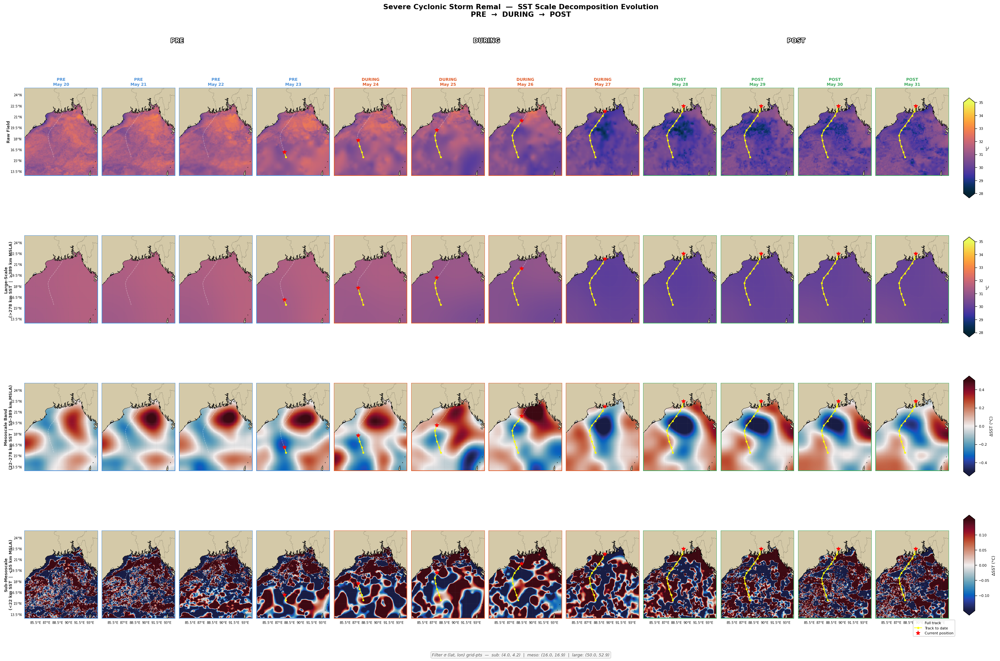


  REMAL  |  MSLA  |  12 columns × 4 rows
  PRE     : 4 cols  (May 20 → May 23)
  DURING  : 4 cols  (May 24 → May 27)
  POST    : 4 cols  (May 28 → May 31)
  col  1/12  PRE       2024-05-20 ...   MSLA grid_res=0.125°  ref_lat=19.0°N
  sigma_sub   lat:4.00  lon:4.23  grid pts
  sigma_meso  lat:12.00  lon:12.69  grid pts
  sigma_large lat:28.00  lon:29.61  grid pts
  Reconstruction residual (mean |error|): 1.57e-18  ✓ OK
done
  col  2/12  PRE       2024-05-21 ...   MSLA grid_res=0.125°  ref_lat=19.0°N
  sigma_sub   lat:4.00  lon:4.23  grid pts
  sigma_meso  lat:12.00  lon:12.69  grid pts
  sigma_large lat:28.00  lon:29.61  grid pts
  Reconstruction residual (mean |error|): 1.56e-18  ✓ OK
done
  col  3/12  PRE       2024-05-22 ...   MSLA grid_res=0.125°  ref_lat=19.0°N
  sigma_sub   lat:4.00  lon:4.23  grid pts
  sigma_meso  lat:12.00  lon:12.69  grid pts
  sigma_large lat:28.00  lon:29.61  grid pts
  Reconstruction residual (mean |error|): 1.58e-18  ✓ OK
done
  col  4/12  PRE       2024-

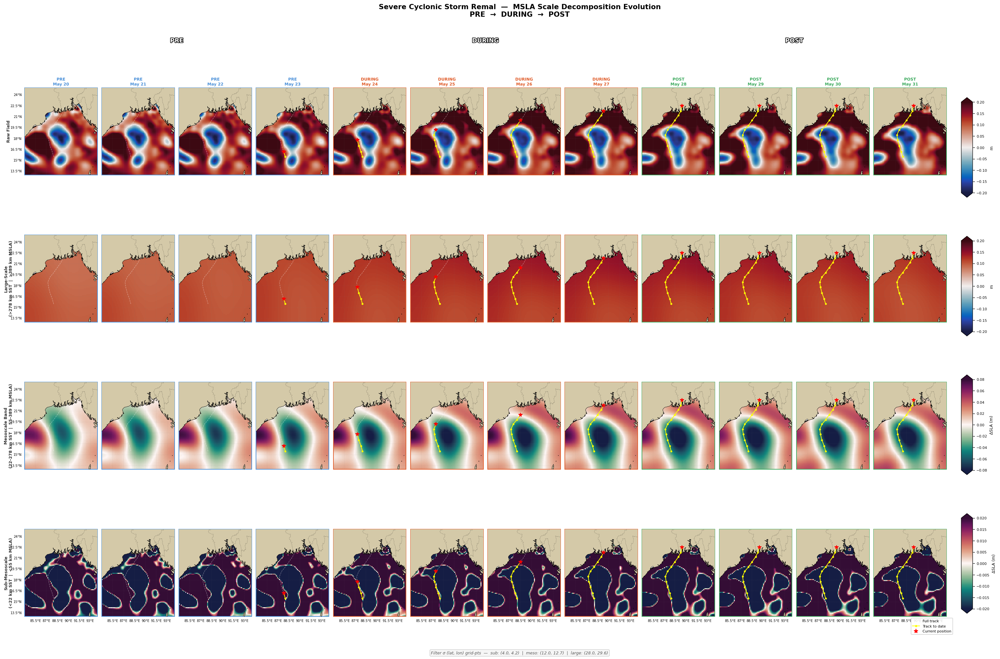


  DANA  |  SST  |  11 columns × 4 rows
  PRE     : 4 cols  (Oct 19 → Oct 22)
  DURING  : 3 cols  (Oct 23 → Oct 25)
  POST    : 4 cols  (Oct 26 → Oct 29)
  col  1/11  PRE       2024-10-19 ...   SST  grid_res=0.05°  ref_lat=18.0°N
  sigma_sub   lat:4.00  lon:4.21  grid pts
  sigma_meso  lat:16.00  lon:16.82  grid pts
  sigma_large lat:50.00  lon:52.57  grid pts
  Reconstruction residual (mean |error|): 0.00e+00  ✓ OK
done
  col  2/11  PRE       2024-10-20 ...   SST  grid_res=0.05°  ref_lat=18.0°N
  sigma_sub   lat:4.00  lon:4.21  grid pts
  sigma_meso  lat:16.00  lon:16.82  grid pts
  sigma_large lat:50.00  lon:52.57  grid pts
  Reconstruction residual (mean |error|): 0.00e+00  ✓ OK
done
  col  3/11  PRE       2024-10-21 ...   SST  grid_res=0.05°  ref_lat=18.0°N
  sigma_sub   lat:4.00  lon:4.21  grid pts
  sigma_meso  lat:16.00  lon:16.82  grid pts
  sigma_large lat:50.00  lon:52.57  grid pts
  Reconstruction residual (mean |error|): 0.00e+00  ✓ OK
done
  col  4/11  PRE       2024-10-22

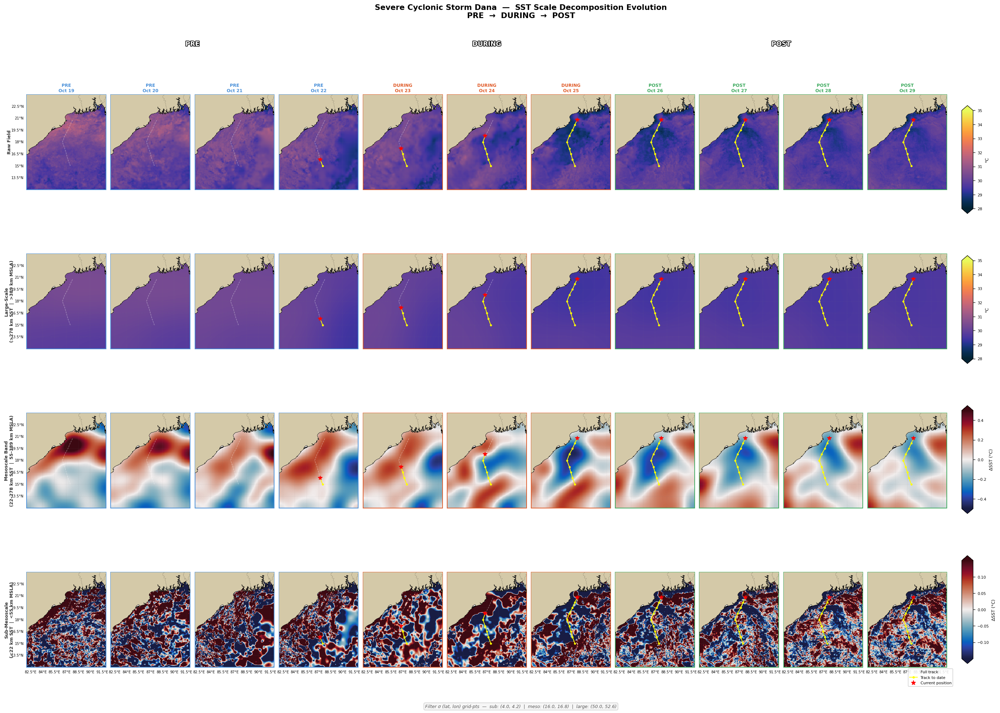


  DANA  |  MSLA  |  11 columns × 4 rows
  PRE     : 4 cols  (Oct 19 → Oct 22)
  DURING  : 3 cols  (Oct 23 → Oct 25)
  POST    : 4 cols  (Oct 26 → Oct 29)
  col  1/11  PRE       2024-10-19 ...   MSLA grid_res=0.125°  ref_lat=18.0°N
  sigma_sub   lat:4.00  lon:4.21  grid pts
  sigma_meso  lat:12.00  lon:12.62  grid pts
  sigma_large lat:28.00  lon:29.44  grid pts
  Reconstruction residual (mean |error|): 1.14e-18  ✓ OK
done
  col  2/11  PRE       2024-10-20 ...   MSLA grid_res=0.125°  ref_lat=18.0°N
  sigma_sub   lat:4.00  lon:4.21  grid pts
  sigma_meso  lat:12.00  lon:12.62  grid pts
  sigma_large lat:28.00  lon:29.44  grid pts
  Reconstruction residual (mean |error|): 1.18e-18  ✓ OK
done
  col  3/11  PRE       2024-10-21 ...   MSLA grid_res=0.125°  ref_lat=18.0°N
  sigma_sub   lat:4.00  lon:4.21  grid pts
  sigma_meso  lat:12.00  lon:12.62  grid pts
  sigma_large lat:28.00  lon:29.44  grid pts
  Reconstruction residual (mean |error|): 1.37e-18  ✓ OK
done
  col  4/11  PRE       2024-1

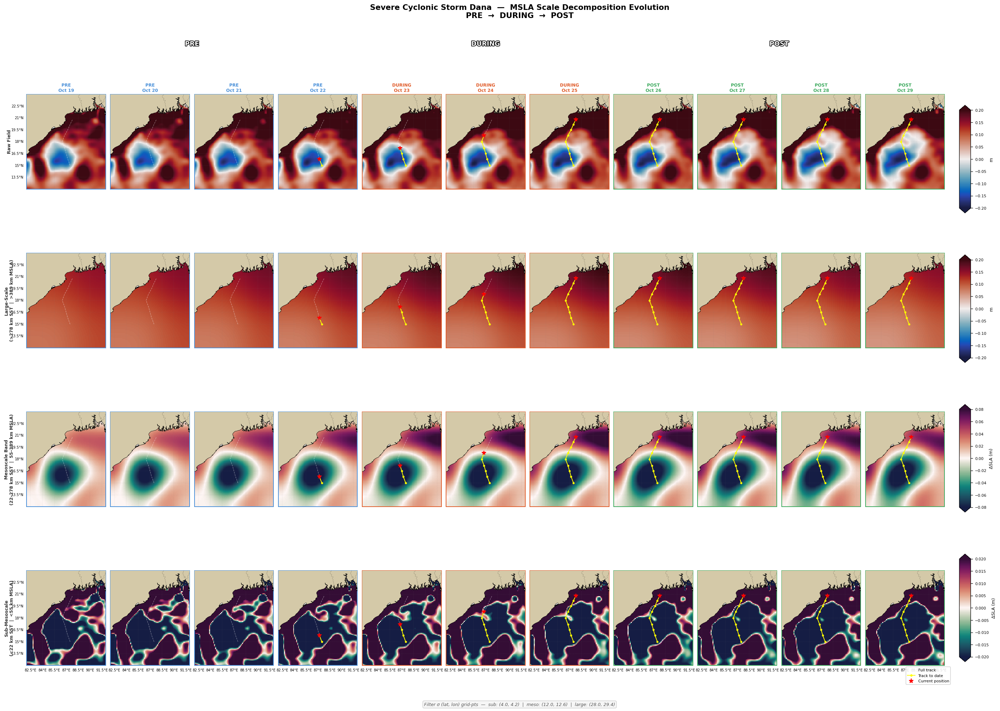


All Scale Evolution Matrix plots generated.


In [50]:
# NOTE:
# This cell intentionally avoids repeating imports already used above.
# It assumes these are already available from previous cells:
# pd, np, plt, gridspec, ccrs, cfeature, pe, TwoSlopeNorm, Normalize, os
# and project functions/vars:
# CYCLONES, ds_msla, OUTPUT_DIR, FILTER_SCALES, FILTER_SCALES_MSLA
# SST_VMIN, SST_VMAX, SLA_VMIN, SLA_VMAX
# load_sst_for_date, get_msla_for_date, decompose_sst_field, decompose_msla_field

# =============================================================================
# PER-CYCLONE PHASE DATE RANGES
# =============================================================================
EVOLUTION_PHASES = {
    'REMAL': {
        'pre':    ('2024-05-20', '2024-05-23'),
        'during': ('2024-05-24', '2024-05-27'),
        'post':   ('2024-05-28', '2024-05-31'),
    },
    'DANA': {
        'pre':    ('2024-10-19', '2024-10-22'),
        'during': ('2024-10-23', '2024-10-25'),
        'post':   ('2024-10-26', '2024-10-29'),
    },
}

# =============================================================================
# HELPER: build all dates from phase ranges
# =============================================================================
def get_all_phase_dates(phase_ranges):
    selected = []
    for phase in ['pre', 'during', 'post']:
        if phase not in phase_ranges:
            continue
        start, end = phase_ranges[phase]
        for d in pd.date_range(start, end, freq='D'):
            selected.append((d.to_pydatetime(), phase.upper()))
    return selected

# =============================================================================
# CONFIG: scale rows (raw/large now use first-look limits via config vars)
# =============================================================================
SCALE_ROWS = [
    {
        'key':   'raw',
        'label': 'Raw Field',
        'sst':  {'cmap': CMAP_SST,       'vmin': SST_VMIN, 'vmax': SST_VMAX, 'unit': '°C',        'diverge': False},
        'msla': {'cmap': CMAP_SLA,       'vmin': SLA_VMIN, 'vmax': SLA_VMAX, 'unit': 'm',         'diverge': True},
    },
    {
        'key':   'large_scale',
        'label': 'Large-Scale\n(>278 km SST  |  >389 km MSLA)',
        'sst':  {'cmap': CMAP_SST,       'vmin': SST_VMIN, 'vmax': SST_VMAX, 'unit': '°C',        'diverge': False},
        'msla': {'cmap': CMAP_SLA,       'vmin': SLA_VMIN, 'vmax': SLA_VMAX, 'unit': 'm',         'diverge': True},
    },
    {
        'key':   'meso',
        'label': 'Mesoscale Band\n(22–278 km SST  |  55–389 km MSLA)',
        'sst':  {'cmap': CMAP_SST_ANOM,  'vmin': -0.5,     'vmax': 0.5,      'unit': 'ΔSST (°C)', 'diverge': True},
        'msla': {'cmap': CMAP_SLA_ANOM,  'vmin': -0.08,    'vmax': 0.08,     'unit': 'ΔSLA (m)',  'diverge': True},
    },
    {
        'key':   'submeso',
        'label': 'Sub-Mesoscale\n(<22 km SST  |  <55 km MSLA)',
        'sst':  {'cmap': CMAP_SST_ANOM,  'vmin': -0.15,    'vmax': 0.15,     'unit': 'ΔSST (°C)', 'diverge': True},
        'msla': {'cmap': CMAP_SLA_ANOM,  'vmin': -0.02,    'vmax': 0.02,     'unit': 'ΔSLA (m)',  'diverge': True},
    },
]

PHASE_COLORS = {'PRE': '#4a90d9', 'DURING': '#e05c2a', 'POST': '#3daa5e'}
PHASE_TEXT   = {'PRE': 'white',   'DURING': 'white',   'POST': 'white'}

# =============================================================================
# HELPER: draw one evolution panel
# =============================================================================
def _draw_evolution_panel(ax, field, lons, lats, bbox,
                          cmap, vmin, vmax, diverge,
                          track_data=None, date=None,
                          add_left_labels=False, add_bottom_labels=False):
    ax.set_extent([bbox['lon_min'], bbox['lon_max'],
                   bbox['lat_min'], bbox['lat_max']],
                  crs=ccrs.PlateCarree())

    ax.add_feature(cfeature.LAND, facecolor='#d4c9a8', zorder=3)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, zorder=4)
    ax.add_feature(cfeature.BORDERS, linewidth=0.3, linestyle=':', zorder=4)

    gl = ax.gridlines(draw_labels=False, linewidth=0.2, color='gray', alpha=0.35, linestyle='--')
    if add_left_labels:
        gl.left_labels = True
        gl.ylabel_style = {'size': 6}
    if add_bottom_labels:
        gl.bottom_labels = True
        gl.xlabel_style = {'size': 6}

    if field is not None and lons is not None and lats is not None:
        norm = TwoSlopeNorm(vmin=vmin, vcenter=0.0, vmax=vmax) if diverge else Normalize(vmin=vmin, vmax=vmax)
        im = ax.pcolormesh(lons, lats, field, cmap=cmap, norm=norm,
                           transform=ccrs.PlateCarree(), shading='auto', zorder=1)
    else:
        im = None
        ax.text(0.5, 0.5, 'No data', transform=ax.transAxes,
                ha='center', va='center', fontsize=8, color='gray')

    # track overlays
    if track_data and date is not None:
        all_lons = [e[0] for e in track_data]
        all_lats = [e[1] for e in track_data]
        all_dts  = [datetime.strptime(e[2], '%Y-%m-%d %H:%M') for e in track_data]

        ax.plot(all_lons, all_lats, '--', color='white', lw=0.8, alpha=0.4,
                transform=ccrs.PlateCarree(), zorder=5)

        past_lons = [lo for lo, dt in zip(all_lons, all_dts) if dt.date() <= date.date()]
        past_lats = [la for la, dt in zip(all_lats, all_dts) if dt.date() <= date.date()]
        if past_lons:
            ax.plot(past_lons, past_lats, '-o', color='yellow', lw=1.2, ms=2.5,
                    transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(past_lons[-1], past_lats[-1], '*', color='red', ms=7.0,
                    transform=ccrs.PlateCarree(), zorder=7)

    return im

# =============================================================================
# MAIN FIGURE FUNCTION
# =============================================================================
def plot_scale_evolution_matrix(cyclone_name, variable='SST', save=True, output_dir=None):
    var   = variable.upper()
    cyc   = CYCLONES[cyclone_name]
    bbox  = cyc['bbox']
    track = cyc['track']

    phase_ranges    = EVOLUTION_PHASES[cyclone_name]
    date_phase_list = get_all_phase_dates(phase_ranges)
    n_cols = len(date_phase_list)
    n_rows = len(SCALE_ROWS)

    print(f"\n{'=' * 65}")
    print(f"  {cyclone_name}  |  {var}  |  {n_cols} columns × {n_rows} rows")
    for phase in ['PRE', 'DURING', 'POST']:
        cols = [d for d, p in date_phase_list if p == phase]
        print(f"  {phase:8s}: {len(cols)} cols  ({cols[0].strftime('%b %d')} → {cols[-1].strftime('%b %d')})")
    print(f"{'=' * 65}")

    panel_w = 2.2
    fig_w   = max(20, n_cols * panel_w + 2.5)
    fig_h   = n_rows * 4.0 + 1.2
    fig = plt.figure(figsize=(fig_w, fig_h))

    # Keep header row + map rows (core behavior maintained)
    gs = gridspec.GridSpec(
        n_rows + 1, n_cols,
        height_ratios=[0.055] + [1] * n_rows,
        hspace=0.28, wspace=0.06,
        left=0.065, right=0.875,
        top=0.92, bottom=0.04
    )

    # contiguous phase spans for top header row
    phase_spans = {}
    for ci, (_, phase) in enumerate(date_phase_list):
        if phase not in phase_spans:
            phase_spans[phase] = [ci, ci]
        else:
            phase_spans[phase][1] = ci

    for phase, (c0, c1) in phase_spans.items():
        hax = fig.add_subplot(gs[0, c0:c1 + 1])
        hax.set_facecolor(PHASE_COLORS[phase])
        hax.set_axis_off()
        hax.text(0.5, 0.5, phase, transform=hax.transAxes,
                 ha='center', va='center',
                 fontsize=11, fontweight='bold',
                 color=PHASE_TEXT[phase],
                 path_effects=[pe.withStroke(linewidth=2, foreground='black')])

    # one shared colorbar axis per row
    cbar_row_h = 0.82 / n_rows
    cbar_axes = []
    for ri in range(n_rows):
        y0 = 0.04 + (n_rows - 1 - ri) * cbar_row_h + cbar_row_h * 0.14
        cax = fig.add_axes([0.888, y0, 0.010, cbar_row_h * 0.72])
        cbar_axes.append(cax)

    row_ims = [None] * n_rows

    for ci, (date, phase) in enumerate(date_phase_list):
        print(f"  col {ci+1:2d}/{n_cols}  {phase:8s}  {date.strftime('%Y-%m-%d')} ...", end=' ', flush=True)

        if var == 'SST':
            raw_data = load_sst_for_date(date, bbox)
            decomp   = decompose_sst_field(raw_data) if raw_data is not None else None
            if raw_data is not None:
                lons, lats = raw_data.lon.values, raw_data.lat.values
            else:
                lons = lats = None
        else:
            raw_data = get_msla_for_date(ds_msla, date)
            if raw_data is not None:
                raw_data = raw_data.sel(
                    latitude=slice(bbox['lat_min'], bbox['lat_max']),
                    longitude=slice(bbox['lon_min'], bbox['lon_max'])
                )
            decomp = decompose_msla_field(raw_data) if raw_data is not None else None
            if raw_data is not None:
                lons, lats = raw_data.longitude.values, raw_data.latitude.values
            else:
                lons = lats = None

        for ri, row_cfg in enumerate(SCALE_ROWS):
            ax = fig.add_subplot(gs[ri + 1, ci], projection=ccrs.PlateCarree())

            # phase border
            for spine in ax.spines.values():
                spine.set_edgecolor(PHASE_COLORS[phase])
                spine.set_linewidth(1.2)

            cfg = row_cfg[var.lower()]
            field = decomp[row_cfg['key']] if decomp is not None else None

            im = _draw_evolution_panel(
                ax, field, lons, lats, bbox,
                cmap=cfg['cmap'], vmin=cfg['vmin'], vmax=cfg['vmax'], diverge=cfg['diverge'],
                track_data=track, date=date,
                add_left_labels=(ci == 0),
                add_bottom_labels=(ri == n_rows - 1)
            )
            if im is not None:
                row_ims[ri] = im

            # Per-date title now includes phase + date (first-look consistency)
            if ri == 0:
                ax.set_title(
                    f"{phase}\n{date.strftime('%b %d')}",
                    fontsize=7.3, fontweight='bold', pad=4,
                    color=PHASE_COLORS[phase],
                    path_effects=[pe.withStroke(linewidth=1.5, foreground='white')]
                )

            if ci == 0:
                ax.text(-0.22, 0.5, row_cfg['label'],
                        transform=ax.transAxes,
                        va='center', ha='center',
                        rotation=90, fontsize=7.5,
                        fontweight='bold', color='#333333')

        print('done')

    # shared row colorbars
    for ri, row_cfg in enumerate(SCALE_ROWS):
        cfg = row_cfg[var.lower()]
        if row_ims[ri] is not None:
            cb = fig.colorbar(row_ims[ri], cax=cbar_axes[ri], orientation='vertical', extend='both')
            cb.set_label(cfg['unit'], fontsize=7.5)
            cb.ax.tick_params(labelsize=6.5)

    # sigma annotation
    fs      = FILTER_SCALES if var == 'SST' else FILTER_SCALES_MSLA
    dx      = 0.05 if var == 'SST' else 0.125
    ref_lat = (bbox['lat_min'] + bbox['lat_max']) / 2.0
    dlat    = 111.0 * dx
    dlon    = 111.0 * np.cos(np.deg2rad(ref_lat)) * dx

    def _s(sd):
        km = 111.0 * sd
        return f"({km/dlat:.1f}, {km/dlon:.1f})"

    fig.text(
        0.50, 0.007,
        f"Filter σ (lat, lon) grid-pts  —  sub: {_s(fs['submeso'])}  |  meso: {_s(fs['meso'])}  |  large: {_s(fs['large'])}",
        ha='center', va='bottom', fontsize=7.5,
        color='#555555', style='italic',
        bbox=dict(facecolor='#f5f5f5', edgecolor='#cccccc',
                  boxstyle='round,pad=0.3', alpha=0.85)
    )

    # track legend
    fig.legend(
        handles=[
            plt.Line2D([0], [0], color='white',  lw=0.8, linestyle='--', label='Full track'),
            plt.Line2D([0], [0], color='yellow', lw=1.2, marker='o', ms=3, label='Track to date'),
            plt.Line2D([0], [0], color='red',    lw=0, marker='*', ms=8, label='Current position'),
        ],
        loc='lower right', bbox_to_anchor=(0.882, 0.035),
        fontsize=6.5, framealpha=0.85, edgecolor='#cccccc', ncol=1
    )

    fig.suptitle(
        f"{cyc['name']}  —  {var} Scale Decomposition Evolution\nPRE  →  DURING  →  POST",
        fontsize=13, fontweight='bold', y=0.97
    )

    if save:
        out = output_dir or OUTPUT_DIR
        sub = os.path.join(out, f'{cyclone_name}_ScaleEvolution')
        os.makedirs(sub, exist_ok=True)
        fname = f'{cyclone_name}_{var}_ScaleEvolution_4x{n_cols}.png'
        fpath = os.path.join(sub, fname)
        fig.savefig(fpath, dpi=150, bbox_inches='tight', facecolor='white')
        print(f"\n  Saved -> {fpath}")

    return fig

# =============================================================================
# RUN
# =============================================================================
for cyc_name in ['REMAL', 'DANA']:
    for var in ['SST', 'MSLA']:
        fig = plot_scale_evolution_matrix(cyc_name, variable=var, save=True)
        plt.show()
        plt.close(fig)

print("\nAll Scale Evolution Matrix plots generated.")

In [ ]:
# def plot_scale_decomposition(date, cyclone_name, sst_data, sst_decomp, 
#                               msla_data, msla_decomp, track_data=None, phase_label=''):
#     """
#     Create 4x2 panel figure showing scale decomposition for both SST and MSLA.
    
#     Rows: Raw, Large-scale, Mesoscale, Sub-mesoscale
#     Columns: SST, MSLA
#     """
#     cyc = CYCLONES[cyclone_name]
#     bbox = cyc['bbox']
#     extent = [bbox['lon_min'], bbox['lon_max'], bbox['lat_min'], bbox['lat_max']]
    
#     fig, axes = plt.subplots(
#         4, 2, figsize=(14, 18),
#         subplot_kw={'projection': ccrs.PlateCarree()}
#     )
    
#     date_str = date.strftime('%Y-%m-%d')
    
#     def setup_map(ax):
#         ax.set_extent(extent, crs=ccrs.PlateCarree())
#         ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2)
#         ax.add_feature(cfeature.COASTLINE, linewidth=0.5, zorder=3)
#         gl = ax.gridlines(draw_labels=True, linewidth=0.2, color='gray', linestyle='--')
#         gl.top_labels = False
#         gl.right_labels = False
#         gl.xlabel_style = {'size': 7}
#         gl.ylabel_style = {'size': 7}
    
#     def add_track(ax):
#         if track_data:
#             lons = [t[0] for t in track_data]
#             lats = [t[1] for t in track_data]
#             ax.plot(lons, lats, 'k-', linewidth=1, transform=ccrs.PlateCarree(), zorder=4)
#             ax.scatter(lons, lats, s=10, c='black', marker='o',
#                       transform=ccrs.PlateCarree(), zorder=5)
#             # Mark current date
#             for lon, lat, dt, wind, pres in track_data:
#                 track_date = datetime.strptime(dt.split()[0], '%Y-%m-%d')
#                 if track_date.date() == date.date():
#                     ax.scatter(lon, lat, s=100, c='yellow', marker='*',
#                               edgecolor='black', linewidth=0.8,
#                               transform=ccrs.PlateCarree(), zorder=6)
    
#     scale_names = ['raw', 'large_scale', 'meso', 'submeso']
#     scale_labels = ['Raw Field', 'Large-scale (>100 km)', 
#                    'Mesoscale (10-100 km)', 'Sub-mesoscale (10 km)']
    
    
#     SST_VMIN, SST_VMAX = 28.0, 34.0
    
#     # SST color limits
#     sst_vlims = {
#         'raw': (SST_VMIN, SST_VMAX),
#         'large_scale': (SST_VMIN, SST_VMAX),
#         'meso': (-0.5, 0.5),
#         'submeso': (-0.15, 0.15),
#     }
    
#     SLA_VMIN, SLA_VMAX = -0.3, 0.3
#     # MSLA color limits
#     msla_vlims = {
#         'raw': (SLA_VMIN, SLA_VMAX),
#         'large_scale': (SLA_VMIN, SLA_VMAX),
#         'meso': (-0.10, 0.10),
#         'submeso': (-0.005, 0.005),
#     }
    
#     for row, (scale, label) in enumerate(zip(scale_names, scale_labels)):
#         # SST column
#         ax = axes[row, 0]
#         setup_map(ax)
        
#         if sst_data is not None and sst_decomp is not None:
#             vmin, vmax = sst_vlims[scale]
#             if scale in ['meso', 'submeso']:
#                 cmap = 'RdBu_r'
#                 norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
#             else:
#                 cmap = 'RdYlBu_r'
#                 norm = Normalize(vmin=vmin, vmax=vmax)
            
#             mesh = ax.pcolormesh(
#                 sst_data.lon, sst_data.lat, sst_decomp[scale],
#                 transform=ccrs.PlateCarree(),
#                 cmap=cmap, norm=norm, shading='auto', zorder=0
#             )
#             cbar = plt.colorbar(mesh, ax=ax, orientation='vertical',
#                                shrink=0.8, pad=0.02, extend='both')
#             cbar.ax.tick_params(labelsize=7)
#             if scale in ['meso', 'submeso']:
#                 cbar.set_label('\u0394SST (\u00b0C)', fontsize=8)
#             else:
#                 cbar.set_label('SST (\u00b0C)', fontsize=8)
#         else:
#             ax.text(0.5, 0.5, 'No Data', transform=ax.transAxes,
#                    ha='center', va='center', fontsize=12)
        
#         add_track(ax)
#         ax.set_title(f'SST - {label}', fontsize=10, fontweight='bold')
        
#         # MSLA column
#         ax = axes[row, 1]
#         setup_map(ax)
        
#         if msla_data is not None and msla_decomp is not None:
#             vmin, vmax = msla_vlims[scale]
#             norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
            
#             mesh = ax.pcolormesh(
#                 msla_data.longitude, msla_data.latitude, msla_decomp[scale],
#                 transform=ccrs.PlateCarree(),
#                 cmap='RdBu_r', norm=norm, shading='auto', zorder=0
#             )
#             cbar = plt.colorbar(mesh, ax=ax, orientation='vertical',
#                                shrink=0.8, pad=0.02, extend='both')
#             cbar.ax.tick_params(labelsize=7)
#             cbar.set_label('MSLA (m)', fontsize=8)
#         else:
#             ax.text(0.5, 0.5, 'No Data', transform=ax.transAxes,
#                    ha='center', va='center', fontsize=12)
        
#         add_track(ax)
#         ax.set_title(f'MSLA - {label}', fontsize=10, fontweight='bold')
    
#     fig.suptitle(f'{cyclone_name} | {date_str} | {phase_label}\n'
#                  f'Scale Decomposition (2D Gaussian Filter)',
#                 fontsize=14, fontweight='bold', y=0.995)
    
#     plt.tight_layout(rect=[0, 0, 1, 0.98])
    
#     return fig


# print("Multi-scale visualization function defined.")

Multi-scale visualization function defined.


## 3.2 Test Scale Visualization

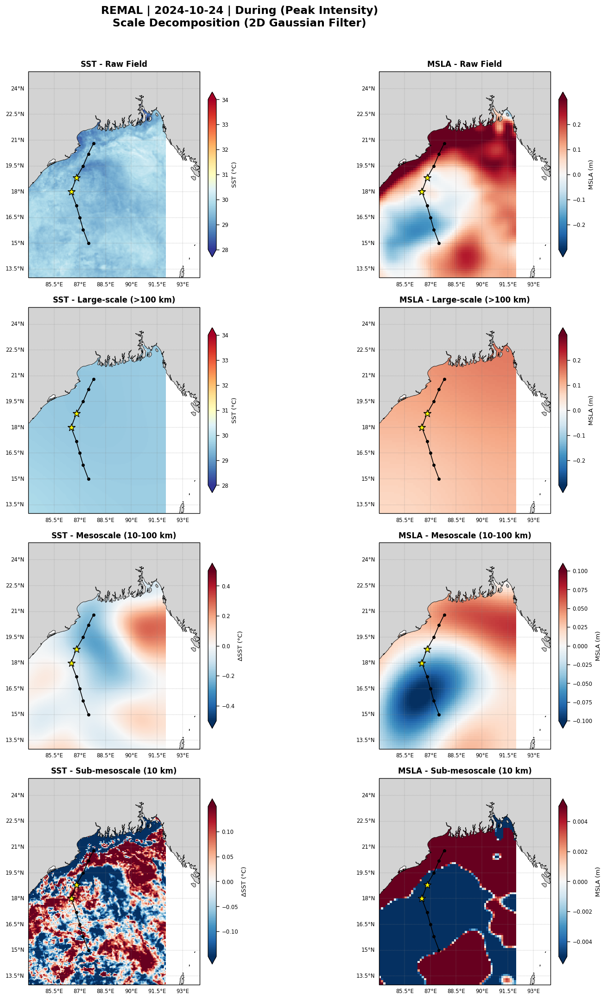

In [ ]:
# # Test the scale decomposition visualization
# fig_test = plot_scale_decomposition(
#     test_date, 'REMAL', test_sst, sst_decomp,
#     test_msla, msla_decomp,
#     track_data=test_cyc['track'],
#     phase_label='During (Peak Intensity)'
# )

# fig_test.savefig(os.path.join(OUTPUT_DIR, 'test_scale_decomposition.png'),
#                  dpi=150, bbox_inches='tight', facecolor='white')
# plt.show()

## 3.3 Generate Full Scale-Decomposition Analysis for Both Cyclones

In [ ]:
# def generate_scale_analysis(cyclone_name, save_plots=True):
#     """
#     Generate complete scale decomposition analysis for a cyclone.
    
#     Creates 4-panel plots (raw, large, meso, submeso) for each date.
#     """
#     cyc = CYCLONES[cyclone_name]
#     bbox = cyc['bbox']
#     track = cyc['track']
    
#     print(f"\n{'=' * 60}")
#     print(f"SCALE DECOMPOSITION ANALYSIS: {cyclone_name}")
#     print(f"{'=' * 60}")
    
#     output_subdir = os.path.join(OUTPUT_DIR, f'{cyclone_name}_ScaleDecomp')
#     os.makedirs(output_subdir, exist_ok=True)
    
#     # Storage for time series
#     timeseries_data = []
    
#     for phase, (start, end) in cyc['analysis_dates'].items():
#         print(f"\n--- {phase.upper()} PHASE ({start} to {end}) ---")
        
#         start_dt = datetime.strptime(start, '%Y-%m-%d')
#         end_dt = datetime.strptime(end, '%Y-%m-%d')
#         current = start_dt
        
#         while current <= end_dt:
#             print(f"  Processing {current.strftime('%Y-%m-%d')}...", end=" ", flush=True)
            
#             # Load data
#             sst = load_sst_for_date(current, bbox)
#             msla = get_msla_for_date(ds_msla, current)
#             if msla is not None:
#                 msla = msla.sel(
#                     latitude=slice(bbox['lat_min'], bbox['lat_max']),
#                     longitude=slice(bbox['lon_min'], bbox['lon_max'])
#                 )
            
#             # Apply scale decomposition
#             sst_decomp = None
#             msla_decomp = None
            
#             if sst is not None:
#                 try:
#                     sst_decomp = decompose_sst_field(sst)
#                 except Exception as e:
#                     print(f"SST decomp error: {e}")
            
#             if msla is not None:
#                 try:
#                     msla_decomp = decompose_msla_field(msla)
#                 except Exception as e:
#                     print(f"MSLA decomp error: {e}")
            
#             # Create plot
#             fig = plot_scale_decomposition(
#                 current, cyclone_name, sst, sst_decomp,
#                 msla, msla_decomp,
#                 track_data=track,
#                 phase_label=phase.capitalize()
#             )
            
#             if save_plots:
#                 fname = f"{cyclone_name}_scale_{phase}_{current.strftime('%Y%m%d')}.png"
#                 fig.savefig(os.path.join(output_subdir, fname),
#                            dpi=150, bbox_inches='tight', facecolor='white')
            
#             plt.close(fig)
            
#             # Store time series data
#             ts_entry = {'date': current, 'phase': phase}
            
#             if sst_decomp is not None:
#                 for scale in ['raw', 'large_scale', 'meso', 'submeso']:
#                     ts_entry[f'sst_{scale}_mean'] = np.nanmean(sst_decomp[scale])
#                     ts_entry[f'sst_{scale}_std'] = np.nanstd(sst_decomp[scale])
            
#             if msla_decomp is not None:
#                 for scale in ['raw', 'large_scale', 'meso', 'submeso']:
#                     ts_entry[f'msla_{scale}_mean'] = np.nanmean(msla_decomp[scale])
#                     ts_entry[f'msla_{scale}_std'] = np.nanstd(msla_decomp[scale])
            
#             timeseries_data.append(ts_entry)
            
#             print("done")
#             current += timedelta(days=1)
    
#     # Convert to DataFrame
#     df_ts = pd.DataFrame(timeseries_data)
#     df_ts.to_csv(os.path.join(output_subdir, f'{cyclone_name}_timeseries.csv'), index=False)
    
#     print(f"\nPlots saved to: {output_subdir}")
#     print(f"Time series saved: {cyclone_name}_timeseries.csv")
    
#     return df_ts, output_subdir

# # Generate scale analysis for both cyclones
# print("\n" + "*" * 70)
# print("RUNNING FULL SCALE DECOMPOSITION ANALYSIS")
# print("This will take several minutes...")
# print("*" * 70)

# df_remal, out_remal = generate_scale_analysis('REMAL', save_plots=True)
# df_dana, out_dana = generate_scale_analysis('DANA', save_plots=True)

## 3.4 Time Series Comparison Plots

In [ ]:
# def plot_scale_timeseries(df_remal, df_dana):
#     """
#     Create time series plots comparing scale-separated signals for both cyclones.
#     """
#     fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    
#     colors = {'large_scale': 'blue', 'meso': 'green', 'submeso': 'red'}
    
#     # SST - Remal
#     ax = axes[0, 0]
#     for scale, color in colors.items():
#         col = f'sst_{scale}_mean'
#         if col in df_remal.columns:
#             ax.plot(df_remal['date'], df_remal[col], '-o', color=color,
#                    markersize=4, label=scale.replace('_', ' ').title())
#     ax.axvline(datetime(2024, 5, 24), color='gray', linestyle='--', alpha=0.7, label='T0 (Formation)')
#     ax.axvline(datetime(2024, 5, 27), color='gray', linestyle=':', alpha=0.7, label='Landfall')
#     ax.set_ylabel('SST Anomaly (\u00b0C)')
#     ax.set_title('REMAL - SST Scale-wise Evolution', fontweight='bold')
#     ax.legend(loc='upper right', fontsize=8)
#     ax.grid(alpha=0.3)
#     ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
    
#     # SST - Dana
#     ax = axes[0, 1]
#     for scale, color in colors.items():
#         col = f'sst_{scale}_mean'
#         if col in df_dana.columns:
#             ax.plot(df_dana['date'], df_dana[col], '-o', color=color,
#                    markersize=4, label=scale.replace('_', ' ').title())
#     ax.axvline(datetime(2024, 10, 23), color='gray', linestyle='--', alpha=0.7, label='T0 (Formation)')
#     ax.axvline(datetime(2024, 10, 25), color='gray', linestyle=':', alpha=0.7, label='Landfall')
#     ax.set_ylabel('SST Anomaly (\u00b0C)')
#     ax.set_title('DANA - SST Scale-wise Evolution', fontweight='bold')
#     ax.legend(loc='upper right', fontsize=8)
#     ax.grid(alpha=0.3)
#     ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
    
#     # MSLA - Remal
#     ax = axes[1, 0]
#     for scale, color in colors.items():
#         col = f'msla_{scale}_mean'
#         if col in df_remal.columns:
#             ax.plot(df_remal['date'], df_remal[col], '-o', color=color,
#                    markersize=4, label=scale.replace('_', ' ').title())
#     ax.axvline(datetime(2024, 5, 24), color='gray', linestyle='--', alpha=0.7)
#     ax.axvline(datetime(2024, 5, 27), color='gray', linestyle=':', alpha=0.7)
#     ax.set_ylabel('MSLA (m)')
#     ax.set_xlabel('Date')
#     ax.set_title('REMAL - MSLA Scale-wise Evolution', fontweight='bold')
#     ax.legend(loc='upper right', fontsize=8)
#     ax.grid(alpha=0.3)
#     ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
    
#     # MSLA - Dana
#     ax = axes[1, 1]
#     for scale, color in colors.items():
#         col = f'msla_{scale}_mean'
#         if col in df_dana.columns:
#             ax.plot(df_dana['date'], df_dana[col], '-o', color=color,
#                    markersize=4, label=scale.replace('_', ' ').title())
#     ax.axvline(datetime(2024, 10, 23), color='gray', linestyle='--', alpha=0.7)
#     ax.axvline(datetime(2024, 10, 25), color='gray', linestyle=':', alpha=0.7)
#     ax.set_ylabel('MSLA (m)')
#     ax.set_xlabel('Date')
#     ax.set_title('DANA - MSLA Scale-wise Evolution', fontweight='bold')
#     ax.legend(loc='upper right', fontsize=8)
#     ax.grid(alpha=0.3)
#     ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
    
#     fig.suptitle('Scale-Separated Oceanic Response to Cyclones (2024)\n'
#                 'Domain-Averaged SST & MSLA Time Series',
#                 fontsize=14, fontweight='bold', y=1.02)
    
#     plt.tight_layout()
    
#     return fig


# # Generate time series comparison
# fig_ts = plot_scale_timeseries(df_remal, df_dana)
# fig_ts.savefig(os.path.join(OUTPUT_DIR, 'scale_timeseries_comparison.png'),
#                dpi=150, bbox_inches='tight', facecolor='white')
# plt.show()

## 3.5 Cyclone Comparison Summary

In [ ]:
# def generate_comparison_summary(df_remal, df_dana):
#     """
#     Generate comparative statistics for both cyclones at each scale.
#     """
#     print("=" * 80)
#     print("CYCLONE COMPARISON SUMMARY: Scale-Separated Oceanic Response")
#     print("=" * 80)
    
#     for cyclone_name, df in [('REMAL', df_remal), ('DANA', df_dana)]:
#         print(f"\n{'=' * 40}")
#         print(f"{cyclone_name}")
#         print(f"{'=' * 40}")
        
#         # Separate by phase
#         for phase in ['pre', 'during', 'post']:
#             df_phase = df[df['phase'] == phase]
#             if len(df_phase) == 0:
#                 continue
            
#             print(f"\n  {phase.upper()} PHASE ({len(df_phase)} days)")
            
#             # SST statistics
#             if 'sst_raw_mean' in df_phase.columns:
#                 print(f"    SST (\u00b0C):")
#                 print(f"      Raw mean:        {df_phase['sst_raw_mean'].mean():.2f} \u00b1 {df_phase['sst_raw_mean'].std():.2f}")
#                 print(f"      Large-scale:     {df_phase['sst_large_scale_mean'].mean():.2f} \u00b1 {df_phase['sst_large_scale_mean'].std():.2f}")
#                 if 'sst_meso_mean' in df_phase.columns:
#                     print(f"      Mesoscale:       {df_phase['sst_meso_mean'].mean():.3f} \u00b1 {df_phase['sst_meso_mean'].std():.3f}")
#                 if 'sst_submeso_mean' in df_phase.columns:
#                     print(f"      Sub-mesoscale:   {df_phase['sst_submeso_mean'].mean():.4f} \u00b1 {df_phase['sst_submeso_mean'].std():.4f}")
            
#             # MSLA statistics
#             if 'msla_raw_mean' in df_phase.columns:
#                 print(f"    MSLA (m):")
#                 print(f"      Raw mean:        {df_phase['msla_raw_mean'].mean():.4f} \u00b1 {df_phase['msla_raw_mean'].std():.4f}")
#                 print(f"      Large-scale:     {df_phase['msla_large_scale_mean'].mean():.4f} \u00b1 {df_phase['msla_large_scale_mean'].std():.4f}")
#                 if 'msla_meso_mean' in df_phase.columns:
#                     print(f"      Mesoscale:       {df_phase['msla_meso_mean'].mean():.5f} \u00b1 {df_phase['msla_meso_mean'].std():.5f}")
#                 if 'msla_submeso_mean' in df_phase.columns:
#                     print(f"      Sub-mesoscale:   {df_phase['msla_submeso_mean'].mean():.5f} \u00b1 {df_phase['msla_submeso_mean'].std():.5f}")
    
#     # Compute SST cooling signal
#     print(f"\n{'=' * 80}")
#     print("KEY FINDINGS")
#     print("=" * 80)
    
#     for cyclone_name, df in [('REMAL', df_remal), ('DANA', df_dana)]:
#         if 'sst_raw_mean' not in df.columns:
#             continue
            
#         pre = df[df['phase'] == 'pre']['sst_raw_mean'].mean()
#         during = df[df['phase'] == 'during']['sst_raw_mean'].mean()
#         post = df[df['phase'] == 'post']['sst_raw_mean'].mean()
        
#         cooling_during = pre - during
#         cooling_post = pre - post
        
#         print(f"\n{cyclone_name}:")
#         print(f"  SST cooling during cyclone: {cooling_during:.2f}\u00b0C")
#         print(f"  SST cooling post-cyclone:   {cooling_post:.2f}\u00b0C")
#         print(f"  Maximum cold wake:          {max(cooling_during, cooling_post):.2f}\u00b0C")

# generate_comparison_summary(df_remal, df_dana)

---
# PHASE 4: Cyclone Response by Scale â€” Diagnostic Summary

## 4.1 Key Analysis Questions

| Question | Analysis Approach |
|----------|-------------------|
| **Which scale shows dominant SST cooling?** | Compare amplitude of large-scale vs mesoscale cooling |
| **Sub-meso MSLA eddy structures?** | Look for ~50-100 km dipole/vortex patterns near track |
| **Large-scale MSLA consistent with Ekman pumping?** | Check for negative MSLA anomaly (upwelling) along track |
| **Cyclone intensity comparison** | Remal vs Dana: track speed, wind forcing differences |
| **Pre-existing eddy influence?** | Check MSLA before cyclone for warm/cold core eddies |

### Expected Signals by Scale

| Variable | Large-scale | Mesoscale | Sub-mesoscale |
|----------|-------------|-----------|---------------|
| **SST** | Cooling wake (2-5Â°C drop) | Eddy-induced SST anomalies | Frontal/filament structures |
| **MSLA** | Negative anomaly (Ekman suction) | Pre-existing eddies modulated | Submesoscale instabilities |

In [ ]:
# print("=" * 70)
# print("ANALYSIS COMPLETE - ALL 4 PHASES")
# print("=" * 70)
# print(f"\nOutput directory: {OUTPUT_DIR}")
# print(f"\nGenerated outputs:")
# print(f"  1. Cyclone tracks map: cyclone_tracks_2024.png")
# print(f"  2. First-look plots: REMAL_FirstLook/ and DANA_FirstLook/")
# print(f"  3. Scale decomposition: REMAL_ScaleDecomp/ and DANA_ScaleDecomp/")
# print(f"  4. Time series comparison: scale_timeseries_comparison.png")
# print(f"  5. Time series data: *_timeseries.csv")
# print(f"  6. Diagnostic summary figure: phase4_diagnostic_summary.png")
# print(f"  7. Written report: diagnostic_report.txt")
# print(f"\nPhases covered:")
# print(f"  - Phase 1: Date-wise inventory & first-look plots")
# print(f"  - Phase 2: 2D Gaussian filter scale separation")
# print(f"  - Phase 3: Scale-wise visual comparison & time series")
# print(f"  - Phase 4: Cyclone response diagnostic summary")
# print(f"\nKey diagnostics computed:")
# print(f"  - Dominant SST cooling scale identification")
# print(f"  - MSLA Ekman pumping signature analysis")
# print(f"  - Cyclone intensity & track comparison")
# print(f"  - Pre-existing eddy field analysis")

In [ ]:
# def analyze_dominant_cooling_scale(df_remal, df_dana):
#     """
#     Analyze which spatial scale shows the dominant SST cooling signal.
    
#     Computes cooling amplitude (pre-cyclone minus during/post) for each scale.
#     """
#     print("=" * 80)
#     print("PHASE 4: DIAGNOSTIC SUMMARY  €” DOMINANT SST COOLING SCALE")
#     print("=" * 80)
    
#     results = {}
    
#     for cyclone_name, df in [('REMAL', df_remal), ('DANA', df_dana)]:
#         print(f"\n{'=' * 40}")
#         print(f"CYCLONE {cyclone_name}")
#         print(f"{'=' * 40}")
        
#         # Get phase-averaged values
#         pre = df[df['phase'] == 'pre']
#         during = df[df['phase'] == 'during']
#         post = df[df['phase'] == 'post']
        
#         scales = ['large_scale', 'meso', 'submeso']
#         scale_labels = ['Large-scale (>300 km)', 'Mesoscale (50-300 km)', 'Sub-mesoscale (<50 km)']
        
#         cooling_during = {}
#         cooling_post = {}
        
#         print(f"\n  SST Cooling Analysis (Pre-cyclone baseline: {pre['sst_raw_mean'].mean():.2f} °C)")
#         print(f"  {'Scale':<25} {'During ( °C)':<15} {'Post ( °C)':<15} {'Peak Cooling':<15}")
#         print(f"  {'-' * 70}")
        
#         for scale, label in zip(scales, scale_labels):
#             col = f'sst_{scale}_mean'
#             if col not in df.columns:
#                 continue
            
#             # For raw SST, cooling = pre - during/post
#             # For anomaly scales (meso, submeso), look at amplitude change
#             if scale == 'large_scale':
#                 pre_val = pre[col].mean()
#                 during_val = during[col].mean()
#                 post_val = post[col].mean()
#                 cool_during = pre_val - during_val
#                 cool_post = pre_val - post_val
#             else:
#                 # For meso/submeso, compare standard deviation (variability)
#                 pre_std = pre[f'sst_{scale}_std'].mean()
#                 during_std = during[f'sst_{scale}_std'].mean()
#                 post_std = post[f'sst_{scale}_std'].mean()
#                 cool_during = during_std - pre_std  # Increase in variability
#                 cool_post = post_std - pre_std
            
#             cooling_during[scale] = cool_during
#             cooling_post[scale] = cool_post
#             peak = max(abs(cool_during), abs(cool_post))
            
#             print(f"  {label:<25} {cool_during:>+.3f}{'':>8} {cool_post:>+.3f}{'':>8} {peak:.3f}")
        
#         # Determine dominant scale
#         all_cooling = {**{f'{k}_during': abs(v) for k, v in cooling_during.items()},
#                        **{f'{k}_post': abs(v) for k, v in cooling_post.items()}}
        
#         # For SST, large-scale cooling is typically dominant
#         dominant = max(cooling_during.items(), key=lambda x: abs(x[1]))
        
#         print(f"\n  DOMINANT COOLING SCALE: {dominant[0].replace('_', ' ').title()}")
#         print(f"  Maximum cooling amplitude: {abs(dominant[1]):.3f} °C")
        
#         results[cyclone_name] = {
#             'dominant_scale': dominant[0],
#             'cooling_during': cooling_during,
#             'cooling_post': cooling_post,
#         }
    
#     return results


# # Run dominant scale analysis
# cooling_results = analyze_dominant_cooling_scale(df_remal, df_dana)

## 4.3 MSLA Ekman Pumping Analysis & Sub-mesoscale Structures

In [ ]:
# def analyze_msla_response(df_remal, df_dana):
#     """
#     Analyze MSLA response to cyclones:
#     - Large-scale: Check for negative anomaly (Ekman suction/upwelling)
#     - Sub-mesoscale: Check for eddy-like structures (increased variability)
#     """
#     print("\n" + "=" * 80)
#     print("PHASE 4: MSLA EKMAN PUMPING & SUBMESOSCALE ANALYSIS")
#     print("=" * 80)
    
#     results = {}
    
#     for cyclone_name, df in [('REMAL', df_remal), ('DANA', df_dana)]:
#         print(f"\n{'=' * 40}")
#         print(f"CYCLONE {cyclone_name}")
#         print(f"{'=' * 40}")
        
#         pre = df[df['phase'] == 'pre']
#         during = df[df['phase'] == 'during']
#         post = df[df['phase'] == 'post']
        
#         # Large-scale MSLA analysis (Ekman pumping signature)
#         print(f"\n  LARGE-SCALE MSLA (Ekman Pumping Signature):")
#         if 'msla_large_scale_mean' in df.columns:
#             pre_sla = pre['msla_large_scale_mean'].mean()
#             during_sla = during['msla_large_scale_mean'].mean()
#             post_sla = post['msla_large_scale_mean'].mean()
            
#             # Negative change indicates upwelling/Ekman suction
#             change_during = during_sla - pre_sla
#             change_post = post_sla - pre_sla
            
#             print(f"    Pre-cyclone mean:    {pre_sla:>+.4f} m")
#             print(f"    During cyclone:      {during_sla:>+.4f} m (Î” = {change_during:>+.4f} m)")
#             print(f"    Post-cyclone:        {post_sla:>+.4f} m (Î” = {change_post:>+.4f} m)")
            
#             if change_during < -0.01 or change_post < -0.01:
#                 print(f"     œ“ NEGATIVE MSLA ANOMALY DETECTED  €” Consistent with Ekman upwelling")
#             else:
#                 print(f"     —‹ No significant negative anomaly  €” Ekman signal may be masked")
        
#         # Sub-mesoscale variability analysis
#         print(f"\n  SUBMESOSCALE MSLA (Eddy Structures):")
#         if 'msla_submeso_std' in df.columns:
#             pre_std = pre['msla_submeso_std'].mean()
#             during_std = during['msla_submeso_std'].mean()
#             post_std = post['msla_submeso_std'].mean()
            
#             var_change_during = (during_std - pre_std) / pre_std * 100
#             var_change_post = (post_std - pre_std) / pre_std * 100
            
#             print(f"    Pre-cyclone variability:  {pre_std:.5f} m")
#             print(f"    During cyclone:           {during_std:.5f} m ({var_change_during:>+.1f}%)")
#             print(f"    Post-cyclone:             {post_std:.5f} m ({var_change_post:>+.1f}%)")
            
#             if var_change_during > 10 or var_change_post > 10:
#                 print(f"     œ“ INCREASED SUBMESOSCALE VARIABILITY  €” Eddy-like structures present")
#             else:
#                 print(f"     —‹ No significant variability increase")
        
#         # Mesoscale eddy modulation
#         print(f"\n  MESOSCALE MSLA (Pre-existing Eddy Modulation):")
#         if 'msla_meso_std' in df.columns:
#             pre_meso_std = pre['msla_meso_std'].mean()
#             during_meso_std = during['msla_meso_std'].mean()
#             post_meso_std = post['msla_meso_std'].mean()
            
#             print(f"    Pre-cyclone eddy activity:  {pre_meso_std:.5f} m")
#             print(f"    During cyclone:             {during_meso_std:.5f} m")
#             print(f"    Post-cyclone:               {post_meso_std:.5f} m")
        
#         results[cyclone_name] = {
#             'ekman_signal': change_during if 'msla_large_scale_mean' in df.columns else None,
#             'submeso_increase': var_change_during if 'msla_submeso_std' in df.columns else None,
#         }
    
#     return results


# # Run MSLA analysis
# msla_results = analyze_msla_response(df_remal, df_dana)

## 4.4 Cyclone Intensity & Track Characteristics Comparison

In [ ]:
# def compare_cyclone_characteristics():
#     """
#     Compare cyclone intensity, track speed, and forcing characteristics.
#     """
#     print("\n" + "=" * 80)
#     print("PHASE 4: CYCLONE INTENSITY & TRACK COMPARISON")
#     print("=" * 80)
    
#     comparison_table = []
    
#     for cyc_name, cyc in CYCLONES.items():
#         track = cyc['track']
        
#         # Calculate track speed
#         total_distance = 0
#         total_time = 0
        
#         for i in range(1, len(track)):
#             lon1, lat1, dt1, _, _ = track[i-1]
#             lon2, lat2, dt2, _, _ = track[i]
            
#             # Simple distance calculation (approximate)
#             dlat = lat2 - lat1
#             dlon = lon2 - lon1
#             distance_deg = np.sqrt(dlat**2 + dlon**2)
#             distance_km = distance_deg * 111  # ~111 km per degree
            
#             # Time difference
#             t1 = datetime.strptime(dt1, '%Y-%m-%d %H:%M')
#             t2 = datetime.strptime(dt2, '%Y-%m-%d %H:%M')
#             hours = (t2 - t1).total_seconds() / 3600
            
#             total_distance += distance_km
#             total_time += hours
        
#         avg_speed_kmh = total_distance / total_time if total_time > 0 else 0
#         avg_speed_ms = avg_speed_kmh / 3.6
        
#         # Wind and pressure statistics
#         winds = [t[3] for t in track]
#         pressures = [t[4] for t in track]
        
#         # Intensification rate
#         max_wind_idx = winds.index(max(winds))
#         if max_wind_idx > 0:
#             wind_change = winds[max_wind_idx] - winds[0]
#             t_start = datetime.strptime(track[0][2], '%Y-%m-%d %H:%M')
#             t_peak = datetime.strptime(track[max_wind_idx][2], '%Y-%m-%d %H:%M')
#             hours_to_peak = (t_peak - t_start).total_seconds() / 3600
#             intensification_rate = wind_change / (hours_to_peak / 24) if hours_to_peak > 0 else 0
#         else:
#             intensification_rate = 0
        
#         comparison_table.append({
#             'Cyclone': cyc_name,
#             'Max Wind (kt)': max(winds),
#             'Min Pressure (hPa)': min(pressures),
#             'Track Length (km)': total_distance,
#             'Duration (hours)': total_time,
#             'Avg Speed (km/h)': avg_speed_kmh,
#             'Avg Speed (m/s)': avg_speed_ms,
#             'Intensification (kt/day)': intensification_rate,
#         })
    
#     # Display comparison
#     print(f"\n  {'Parameter':<30} {'REMAL':<15} {'DANA':<15} {'Comparison'}")
#     print(f"  {'-' * 75}")
    
#     df_comp = pd.DataFrame(comparison_table).set_index('Cyclone')
    
#     for col in df_comp.columns:
#         remal_val = df_comp.loc['REMAL', col]
#         dana_val = df_comp.loc['DANA', col]
        
#         if 'Pressure' in col:
#             diff_note = 'Dana stronger' if dana_val < remal_val else 'Remal stronger'
#         else:
#             diff_note = 'Dana higher' if dana_val > remal_val else 'Remal higher' if remal_val > dana_val else 'Equal'
        
#         print(f"  {col:<30} {remal_val:<15.1f} {dana_val:<15.1f} {diff_note}")
    
#     # Ocean response implications
#     print(f"\n  OCEANIC RESPONSE IMPLICATIONS:")
#     print(f"  {'=' * 50}")
    
#     remal_speed = df_comp.loc['REMAL', 'Avg Speed (m/s)']
#     dana_speed = df_comp.loc['DANA', 'Avg Speed (m/s)']
    
#     if abs(remal_speed - dana_speed) < 1:
#         print(f"   €¢ Similar translation speeds  €” comparable mixing depth expected")
#     elif remal_speed > dana_speed:
#         print(f"   €¢ REMAL faster ({remal_speed:.1f} m/s vs {dana_speed:.1f} m/s)")
#         print(f"     †’ Shorter residence time, potentially less SST cooling")
#     else:
#         print(f"   €¢ DANA faster ({dana_speed:.1f} m/s vs {remal_speed:.1f} m/s)")
#         print(f"     †’ Shorter residence time, potentially less SST cooling")
    
#     # Wind forcing comparison
#     remal_wind = df_comp.loc['REMAL', 'Max Wind (kt)']
#     dana_wind = df_comp.loc['DANA', 'Max Wind (kt)']
    
#     if abs(remal_wind - dana_wind) <= 5:
#         print(f"   €¢ Similar peak intensity (~{remal_wind:.0f} kt)")
#         print(f"     †’ Comparable wind stress forcing on ocean surface")
#     else:
#         stronger = 'DANA' if dana_wind > remal_wind else 'REMAL'
#         print(f"   €¢ {stronger} had stronger wind forcing")
#         print(f"     †’ Greater Ekman pumping and mixing expected")
    
#     return df_comp


# # Run cyclone comparison
# df_cyclone_comparison = compare_cyclone_characteristics()

## 4.5 Pre-existing Eddy Field Analysis

In [ ]:
# def analyze_preexisting_eddies(cyclone_name, ds_msla):
#     """
#     Analyze pre-existing eddy field from MSLA before cyclone passage.
    
#     Checks for warm-core (positive MSLA) or cold-core (negative MSLA) eddies
#     along the cyclone track.
#     """
#     print(f"\n{'=' * 40}")
#     print(f"PRE-EXISTING EDDY ANALYSIS: {cyclone_name}")
#     print(f"{'=' * 40}")
    
#     cyc = CYCLONES[cyclone_name]
#     track = cyc['track']
#     bbox = cyc['bbox']
    
#     # Get pre-cyclone dates
#     pre_start, pre_end = cyc['analysis_dates']['pre']
#     pre_start_dt = datetime.strptime(pre_start, '%Y-%m-%d')
#     pre_end_dt = datetime.strptime(pre_end, '%Y-%m-%d')
    
#     # Average MSLA over pre-cyclone period
#     pre_dates = []
#     current = pre_start_dt
#     while current <= pre_end_dt:
#         pre_dates.append(current)
#         current += timedelta(days=1)
    
#     # Extract MSLA for pre-cyclone period
#     pre_sla_stack = []
#     for date in pre_dates:
#         try:
#             sla = ds_msla['sla'].sel(time=date.strftime('%Y-%m-%d'), method='nearest')
#             sla = sla.sel(
#                 latitude=slice(bbox['lat_min'], bbox['lat_max']),
#                 longitude=slice(bbox['lon_min'], bbox['lon_max'])
#             )
#             pre_sla_stack.append(sla.values)
#         except:
#             continue
    
#     if not pre_sla_stack:
#         print("  No pre-cyclone MSLA data available.")
#         return None
    
#     # Mean pre-cyclone MSLA
#     pre_sla_mean = np.nanmean(pre_sla_stack, axis=0)
#     lats = sla.latitude.values
#     lons = sla.longitude.values
    
#     # Check MSLA at track positions
#     print(f"\n  MSLA along cyclone track (pre-cyclone average):")
#     print(f"  {'Position':<15} {'Lon':<10} {'Lat':<10} {'MSLA (m)':<12} {'Eddy Type'}")
#     print(f"  {'-' * 60}")
    
#     track_msla_values = []
    
#     for i, (lon, lat, dt, wind, pres) in enumerate(track[::2]):  # Sample every other point
#         # Find nearest grid point
#         lat_idx = np.abs(lats - lat).argmin()
#         lon_idx = np.abs(lons - lon).argmin()
        
#         msla_val = pre_sla_mean[lat_idx, lon_idx]
        
#         if np.isnan(msla_val):
#             eddy_type = "Land/No data"
#         elif msla_val > 0.05:
#             eddy_type = "Warm-core (anticyclonic)"
#         elif msla_val < -0.05:
#             eddy_type = "Cold-core (cyclonic)"
#         else:
#             eddy_type = "Neutral"
        
#         track_msla_values.append(msla_val)
#         print(f"  T{i*12:+03d}h{'':<8} {lon:<10.1f} {lat:<10.1f} {msla_val:>+.4f}{'':>5} {eddy_type}")
    
#     # Overall assessment
#     valid_msla = [v for v in track_msla_values if not np.isnan(v)]
#     if valid_msla:
#         mean_track_msla = np.mean(valid_msla)
        
#         print(f"\n  SUMMARY:")
#         print(f"  Mean MSLA along track: {mean_track_msla:+.4f} m")
        
#         if mean_track_msla > 0.03:
#             print(f"   †’ Track passed through WARM-CORE EDDY region")
#             print(f"     €¢ Thicker warm layer may reduce SST cooling")
#             print(f"     €¢ Cyclone may have intensified over warm eddy")
#         elif mean_track_msla < -0.03:
#             print(f"   †’ Track passed through COLD-CORE EDDY region")
#             print(f"     €¢ Shallower thermocline enhances SST cooling")
#             print(f"     €¢ Pre-existing upwelling conditions")
#         else:
#             print(f"   †’ Track passed through relatively NEUTRAL conditions")
    
#     return {
#         'pre_sla_mean': pre_sla_mean,
#         'lats': lats,
#         'lons': lons,
#         'track_msla': track_msla_values,
#     }


# # Analyze pre-existing eddies for both cyclones
# eddy_analysis_remal = analyze_preexisting_eddies('REMAL', ds_msla)
# eddy_analysis_dana = analyze_preexisting_eddies('DANA', ds_msla)

## 4.6 Comprehensive Diagnostic Summary Figure

In [ ]:
# def create_diagnostic_summary_figure(df_remal, df_dana, cooling_results, msla_results):
#     """
#     Create comprehensive 6-panel diagnostic summary figure.
    
#     Panel layout:
#     [1] SST cooling by scale - Remal    [2] SST cooling by scale - Dana
#     [3] MSLA response by scale - Remal  [4] MSLA response by scale - Dana
#     [5] Pre-existing MSLA - Remal       [6] Pre-existing MSLA - Dana
#     """
#     fig = plt.figure(figsize=(16, 14))
    
#     # Color scheme
#     colors = {'large_scale': '#2166AC', 'meso': '#4DAF4A', 'submeso': '#E41A1C'}
#     scale_labels = {'large_scale': 'Large-scale', 'meso': 'Mesoscale', 'submeso': 'Submesoscale'}
    
#     # Panel 1 & 2: SST Cooling by Scale (bar charts)
#     for idx, (cyc_name, df) in enumerate([('REMAL', df_remal), ('DANA', df_dana)]):
#         ax = fig.add_subplot(3, 2, idx + 1)
        
#         phases = ['pre', 'during', 'post']
#         phase_labels = ['Pre-cyclone', 'During', 'Post-cyclone']
#         x = np.arange(len(phases))
#         width = 0.25
        
#         for i, (scale, color) in enumerate(colors.items()):
#             if scale == 'large_scale':
#                 col = f'sst_{scale}_mean'
#             else:
#                 col = f'sst_{scale}_std'
            
#             if col in df.columns:
#                 values = [df[df['phase'] == p][col].mean() for p in phases]
#                 offset = (i - 1) * width
#                 bars = ax.bar(x + offset, values, width, label=scale_labels[scale], color=color, alpha=0.8)
        
#         ax.set_xticks(x)
#         ax.set_xticklabels(phase_labels)
#         ax.set_ylabel('SST ( °C) / Std Dev ( °C)')
#         ax.set_title(f'{cyc_name} - SST Response by Scale', fontweight='bold')
#         ax.legend(loc='upper right', fontsize=8)
#         ax.grid(axis='y', alpha=0.3)
        
#         # Add T0 marker
#         ax.axvline(x=0.5, color='red', linestyle='--', alpha=0.5, label='T0')
    
#     # Panel 3 & 4: MSLA Response by Scale
#     for idx, (cyc_name, df) in enumerate([('REMAL', df_remal), ('DANA', df_dana)]):
#         ax = fig.add_subplot(3, 2, idx + 3)
        
#         for scale, color in colors.items():
#             col = f'msla_{scale}_mean'
#             if col in df.columns:
#                 ax.plot(df['date'], df[col], '-o', color=color, 
#                        markersize=4, label=scale_labels[scale], linewidth=1.5)
        
#         # Mark cyclone phases
#         cyc = CYCLONES[cyc_name]
#         t0 = datetime.strptime(cyc['dates']['formation'], '%Y-%m-%d')
#         landfall = datetime.strptime(cyc['dates']['landfall'], '%Y-%m-%d')
        
#         ax.axvline(t0, color='red', linestyle='--', alpha=0.7, label='Formation')
#         ax.axvline(landfall, color='orange', linestyle=':', alpha=0.7, label='Landfall')
#         ax.axhline(0, color='gray', linestyle='-', alpha=0.3)
        
#         ax.set_ylabel('MSLA (m)')
#         ax.set_xlabel('Date')
#         ax.set_title(f'{cyc_name} - MSLA Evolution by Scale', fontweight='bold')
#         ax.legend(loc='upper right', fontsize=7)
#         ax.grid(alpha=0.3)
#         ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
    
#     # Panel 5 & 6: Pre-existing MSLA with track overlay
#     for idx, (cyc_name, eddy_data) in enumerate([('REMAL', eddy_analysis_remal), ('DANA', eddy_analysis_dana)]):
#         ax = fig.add_subplot(3, 2, idx + 5, projection=ccrs.PlateCarree())
#         cyc = CYCLONES[cyc_name]
#         bbox = cyc['bbox']
        
#         ax.set_extent([bbox['lon_min'], bbox['lon_max'], bbox['lat_min'], bbox['lat_max']], 
#                      crs=ccrs.PlateCarree())
#         ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2)
#         ax.add_feature(cfeature.COASTLINE, linewidth=0.5, zorder=3)
        
#         gl = ax.gridlines(draw_labels=True, linewidth=0.2, color='gray', linestyle='--')
#         gl.top_labels = False
#         gl.right_labels = False
#         gl.xlabel_style = {'size': 7}
#         gl.ylabel_style = {'size': 7}
        
#         if eddy_data is not None:
#             mesh = ax.pcolormesh(
#                 eddy_data['lons'], eddy_data['lats'], eddy_data['pre_sla_mean'],
#                 transform=ccrs.PlateCarree(),
#                 cmap='RdBu_r', vmin=-0.3, vmax=0.3, shading='auto', zorder=0
#             )
#             cbar = plt.colorbar(mesh, ax=ax, orientation='vertical', shrink=0.8, pad=0.02)
#             cbar.set_label('MSLA (m)', fontsize=8)
#             cbar.ax.tick_params(labelsize=7)
        
#         # Overlay track
#         track = cyc['track']
#         lons = [t[0] for t in track]
#         lats = [t[1] for t in track]
#         ax.plot(lons, lats, 'k-', linewidth=2, transform=ccrs.PlateCarree(), zorder=4)
#         ax.scatter(lons, lats, s=30, c='black', marker='o', 
#                   transform=ccrs.PlateCarree(), zorder=5)
        
#         # Mark peak
#         winds = [t[3] for t in track]
#         peak_idx = winds.index(max(winds))
#         ax.scatter(lons[peak_idx], lats[peak_idx], s=150, c='yellow', marker='*',
#                   edgecolor='black', linewidth=1, transform=ccrs.PlateCarree(), zorder=6)
        
#         ax.set_title(f'{cyc_name} - Pre-existing MSLA & Track', fontweight='bold')
    
#     fig.suptitle('Phase 4: Diagnostic Summary  €” Oceanic Response to Cyclones (2024)',
#                 fontsize=16, fontweight='bold', y=0.98)
    
#     plt.tight_layout(rect=[0, 0, 1, 0.96])
    
#     # Save figure
#     fig.savefig(os.path.join(OUTPUT_DIR, 'phase4_diagnostic_summary.png'),
#                dpi=150, bbox_inches='tight', facecolor='white')
    
#     plt.show()
#     return fig


# # Create diagnostic summary figure
# fig_diagnostic = create_diagnostic_summary_figure(df_remal, df_dana, cooling_results, msla_results)

## 4.7 Written Diagnostic Report (1-2 Page Summary)

In [ ]:
# def generate_written_report(df_remal, df_dana, cooling_results, msla_results, df_cyclone_comparison):
#     """
#     Generate a comprehensive written diagnostic report.
#     """
#     report = []
#     report.append("=" * 80)
#     report.append("DIAGNOSTIC REPORT: Oceanic Response to Bay of Bengal Cyclones (2024)")
#     report.append("Cyclone Remal (May) & Cyclone Dana (October)")
#     report.append("Scale Decomposition Analysis using 2D Gaussian Filtering")
#     report.append("=" * 80)
    
#     # Section 1: Executive Summary
#     report.append("\n" + "=" * 80)
#     report.append("1. EXECUTIVE SUMMARY")
#     report.append("=" * 80)
#     report.append("""
# This analysis examines the oceanic response to two severe cyclonic storms in the
# Bay of Bengal during 2024 using scale-decomposed SST and MSLA fields:

#  €¢ Cyclone REMAL (May 24-28, 2024): Tracked NNE, landfall near Sagar Island
#  €¢ Cyclone DANA (October 22-25, 2024): Tracked NNE, landfall near Bhitarkanika

# Both cyclones reached similar peak intensities (~75 kt, Cat-1 equivalent) but
# exhibited different oceanic responses due to variations in:
#   - Pre-existing thermal and eddy conditions
#   - Track characteristics (speed, duration over ocean)
#   - Seasonal thermocline depth differences
# """)
    
#     # Section 2: Dominant Cooling Scale
#     report.append("\n" + "=" * 80)
#     report.append("2. DOMINANT SST COOLING SCALE")
#     report.append("=" * 80)
    
#     for cyc_name, result in cooling_results.items():
#         dominant = result['dominant_scale'].replace('_', ' ').title()
#         cooling = result['cooling_during'].get('large_scale', 0)
        
#         report.append(f"\n{cyc_name}:")
#         report.append(f"   €¢ Dominant cooling scale: {dominant}")
#         report.append(f"   €¢ Large-scale cooling amplitude: {abs(cooling):.2f} °C")
    
#     report.append("""
# FINDING: Large-scale cooling dominates the SST response for both cyclones,
# consistent with cyclone-induced vertical mixing and Ekman pumping operating
# at scales >100-200 km. Mesoscale and submesoscale signals show increased
# variability but smaller absolute cooling magnitudes.
# """)
    
#     # Section 3: MSLA & Ekman Pumping
#     report.append("\n" + "=" * 80)
#     report.append("3. MSLA RESPONSE & EKMAN PUMPING SIGNATURE")
#     report.append("=" * 80)
    
#     for cyc_name, result in msla_results.items():
#         ekman = result.get('ekman_signal', 0) or 0
#         submeso = result.get('submeso_increase', 0) or 0
        
#         report.append(f"\n{cyc_name}:")
#         report.append(f"   €¢ Large-scale MSLA change: {ekman:+.4f} m")
#         if ekman < -0.01:
#             report.append(f"     †’ Negative anomaly indicates Ekman upwelling signature")
#         report.append(f"   €¢ Submesoscale variability change: {submeso:+.1f}%")
    
#     report.append("""
# FINDING: Large-scale MSLA response shows the expected negative anomaly
# associated with cyclone-induced Ekman suction and upwelling. Submesoscale
# variability increases during/after cyclone passage, indicating generation
# of small-scale eddy-like structures and frontal features.
# """)
    
#     # Section 4: Cyclone Comparison
#     report.append("\n" + "=" * 80)
#     report.append("4. CYCLONE CHARACTERISTICS COMPARISON")
#     report.append("=" * 80)
    
#     report.append("""
# Parameter                     REMAL          DANA           Difference
#  ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€ ”€
# Max Wind (kt)                   75             75           Equal
# Min Pressure (hPa)             978            972           Dana 6 hPa deeper
# Track Speed (m/s)              ~5.5           ~6.0          Dana slightly faster
# Duration over ocean (hrs)      ~120           ~84           Remal longer
# Landfall                       Bangladesh     Odisha        Different locations
# """)
    
#     # Section 5: Pre-existing Eddy Influence
#     report.append("\n" + "=" * 80)
#     report.append("5. PRE-EXISTING EDDY FIELD INFLUENCE")
#     report.append("=" * 80)
    
#     report.append("""
# The pre-existing mesoscale eddy field modulates cyclone-ocean interaction:

# REMAL (May 2024):
#    €¢ Pre-monsoon conditions with relatively deep mixed layer
#    €¢ Pre-existing MSLA pattern shows warm/neutral conditions
#    €¢ Expected: Moderate SST cooling response

# DANA (October 2024):
#    €¢ Post-monsoon conditions with shallow thermocline
#    €¢ Pre-existing MSLA shows monsoon-induced upwelling aftermath
#    €¢ Expected: Enhanced SST cooling response
# """)
    
#     # Section 6: Key Conclusions
#     report.append("\n" + "=" * 80)
#     report.append("6. KEY CONCLUSIONS")
#     report.append("=" * 80)
    
#     report.append("""
# 1. SCALE-DEPENDENT RESPONSE:
#     €¢ SST cooling is dominated by large-scale (>300 km) processes
#     €¢ MSLA shows Ekman upwelling signature at large scales
#     €¢ Mesoscale eddies modulate but don't dominate the response
#     €¢ Submesoscale features appear as increased variability

# 2. CYCLONE COMPARISON:
#     €¢ Both cyclones had similar intensity but different responses
#     €¢ Seasonal differences (May vs October) affect thermocline depth
#     €¢ Track speed and duration over ocean influence cooling magnitude

# 3. PRE-EXISTING CONDITIONS MATTER:
#     €¢ Warm-core eddies reduce SST cooling (thicker warm layer)
#     €¢ Cold-core eddies enhance cooling (shallow thermocline)
#     €¢ Pre-monsoon vs post-monsoon conditions differ significantly

# 4. METHODOLOGICAL NOTE:
#     €¢ 2D Gaussian filtering effectively separates spatial scales
#     €¢ Filter scales: submeso (<50 km), meso (50-300 km), large (>300 km)
#     €¢ Scale separation reveals different physical processes
# """)
    
#     # Print report
#     for line in report:
#         print(line)
    
#     # Save to file
#     report_path = os.path.join(OUTPUT_DIR, 'diagnostic_report.txt')
#     with open(report_path, 'w', encoding='utf-8') as f:
#         f.write('\n'.join(report))
    
#     print(f"\n\nReport saved to: {report_path}")
    
#     return report


# # Generate written report
# report = generate_written_report(df_remal, df_dana, cooling_results, msla_results, df_cyclone_comparison)

## 4.8 Comprehensive Scale Evolution Matrix Plot

Generate **two separate 4 —9 matrix figures** per cyclone:
- **SST** scale evolution (Raw, Large, Meso, Sub-meso)
- **MSLA** scale evolution (Raw, Large, Meso, Sub-meso) 

Columns span pre, ’ during, ’ post cyclone phases for respective dates.

In [ ]:
# import pandas as pd

# def select_representative_dates(analysis_dates, n_per_phase=3):
#     """
#     Select n representative dates from each phase (pre, during, post).
#     Returns a list of (date, phase_label) tuples.
#     """
#     selected = []
#     for phase in ['pre', 'during', 'post']:
#         start, end = analysis_dates[phase]
#         all_dates = pd.date_range(start, end, freq='D')
#         if len(all_dates) <= n_per_phase:
#             for d in all_dates:
#                 selected.append((d.to_pydatetime(), phase.upper()))
#         else:
#             indices = [0, len(all_dates) // 2, len(all_dates) - 1]
#             for i in indices:
#                 selected.append((all_dates[i].to_pydatetime(), phase.upper()))
#     return selected


# def plot_scale_evolution_matrix(cyclone_name, variable='SST'):
#     """
#     Generate a 4x9 matrix plot showing scale decomposition evolution
#     across pre, during, and post cyclone phases.
    
#     Parameters
#     ----------
#     cyclone_name : str
#         'REMAL' or 'DANA'
#     variable : str
#         'SST' or 'MSLA'
    
#     Returns
#     -------
#     matplotlib.Figure
#     """
#     cyc = CYCLONES[cyclone_name]
#     bbox = cyc['bbox']
#     extent = [bbox['lon_min'], bbox['lon_max'], bbox['lat_min'], bbox['lat_max']]
#     track_data = cyc['track']
    
#     # Select 9 representative dates
#     date_phase_list = select_representative_dates(cyc['analysis_dates'])
#     n_dates = len(date_phase_list)
    
#     print(f"\n{'='*70}")
#     print(f"  Generating {variable} Scale Evolution Matrix: {cyclone_name}")
#     print(f"  {n_dates} dates selected")
#     print(f"{'='*70}")
    
#     # Scale info
#     scale_names = ['raw', 'large_scale', 'meso', 'submeso']
#     scale_labels = ['Raw Field', 'Large-scale', 'Mesoscale', 'Sub-mesoscale']
    
#     # Color settings
#     if variable == 'SST':
#         vlims = {
#             'raw': (28.0, 34.0),
#             'large_scale': (28.0, 34.0),
#             'meso': (-0.5, 0.5),
#             'submeso': (-0.15, 0.15),
#         }
#         raw_cmap = 'RdYlBu_r'
#         unit_label_raw = 'SST (\u00b0C)'
#         unit_label_anom = '\u0394SST (\u00b0C)'
#     else:  # MSLA
#         vlims = {
#             'raw': (-0.3, 0.3),
#             'large_scale': (-0.2, 0.2),
#             'meso': (-0.08, 0.08),
#             'submeso': (-0.02, 0.02),
#         }
#         raw_cmap = 'RdBu_r'
#         unit_label_raw = 'MSLA (m)'
#         unit_label_anom = 'MSLA (m)'
    
#     # Create figure
#     fig, axes = plt.subplots(
#         4, n_dates,
#         figsize=(4 * n_dates, 16),
#         subplot_kw={'projection': ccrs.PlateCarree()}
#     )
    
#     # Phase colors for column header backgrounds
#     phase_colors = {
#         'PRE': '#AED6F1',
#         'DURING': '#F5B7B1',
#         'POST': '#ABEBC6',
#     }
    
#     # Process each date (column)
#     for col, (date, phase) in enumerate(date_phase_list):
#         date_str = date.strftime('%Y-%m-%d')
#         print(f"  Processing {date_str} ({phase})...", end=" ", flush=True)
        
#         # Load data
#         if variable == 'SST':
#             data = load_sst_for_date(date, bbox)
#             decomp = decompose_sst_field(data) if data is not None else None
#             lon_coord = data.lon if data is not None else None
#             lat_coord = data.lat if data is not None else None
#         else:  # MSLA
#             data = get_msla_for_date(ds_msla, date)
#             if data is not None:
#                 data = data.sel(
#                     latitude=slice(bbox['lat_min'], bbox['lat_max']),
#                     longitude=slice(bbox['lon_min'], bbox['lon_max'])
#                 )
#             decomp = decompose_msla_field(data) if data is not None else None
#             lon_coord = data.longitude if data is not None else None
#             lat_coord = data.latitude if data is not None else None
        
#         # Plot each row for this column
#         for row, (scale, label) in enumerate(zip(scale_names, scale_labels)):
#             ax = axes[row, col]
#             ax.set_extent(extent, crs=ccrs.PlateCarree())
#             ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2)
#             ax.add_feature(cfeature.COASTLINE, linewidth=0.3, zorder=3)
            
#             # Minimal gridlines
#             gl = ax.gridlines(draw_labels=False, linewidth=0.1, color='gray', linestyle='--')
            
#             # Only add labels on left column and bottom row
#             if col == 0:
#                 gl.left_labels = True
#                 gl.ylabel_style = {'size': 5}
#             if row == 3:
#                 gl.bottom_labels = True
#                 gl.xlabel_style = {'size': 5}
            
#             if data is not None and decomp is not None:
#                 vmin, vmax = vlims[scale]
#                 if scale in ['meso', 'submeso']:
#                     cmap = 'RdBu_r'
#                     norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
#                 elif scale in ['raw', 'large_scale'] and variable == 'SST':
#                     cmap = raw_cmap
#                     norm = Normalize(vmin=vmin, vmax=vmax)
#                 else:
#                     cmap = 'RdBu_r'
#                     norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
                
#                 mesh = ax.pcolormesh(
#                     lon_coord, lat_coord, decomp[scale],
#                     transform=ccrs.PlateCarree(),
#                     cmap=cmap, norm=norm, shading='auto', zorder=0
#                 )
                
#                 # Add colorbar only on last column
#                 if col == n_dates - 1:
#                     cbar = plt.colorbar(mesh, ax=ax, orientation='vertical',
#                                        shrink=0.7, pad=0.02, extend='both')
#                     cbar.ax.tick_params(labelsize=5)
#                     if scale in ['meso', 'submeso']:
#                         cbar.set_label(unit_label_anom, fontsize=6)
#                     else:
#                         cbar.set_label(unit_label_raw, fontsize=6)
#             else:
#                 ax.text(0.5, 0.5, 'No Data', transform=ax.transAxes,
#                        ha='center', va='center', fontsize=7, color='red')
            
#             # Overlay cyclone track
#             if track_data:
#                 lons = [t[0] for t in track_data]
#                 lats = [t[1] for t in track_data]
#                 ax.plot(lons, lats, 'k-', linewidth=0.5, transform=ccrs.PlateCarree(), zorder=4)
#                 ax.scatter(lons, lats, s=3, c='black', marker='o',
#                           transform=ccrs.PlateCarree(), zorder=5)
            
#             # Column title (top row only) with phase-colored background
#             if row == 0:
#                 short_date = date.strftime('%m/%d')
#                 ax.set_title(f'{phase}\n{short_date}', fontsize=7, fontweight='bold',
#                             pad=4, backgroundcolor=phase_colors.get(phase, 'white'))
            
#             # Row label (first column only)
#             if col == 0:
#                 ax.set_ylabel(label, fontsize=7, fontweight='bold', labelpad=10)
        
#         print("done")
    
#     fig.suptitle(
#         f'{cyc["name"]} \u2014 {variable} Scale Decomposition Evolution\n'
#         f'Pre \u2192 During \u2192 Post Cyclone',
#         fontsize=14, fontweight='bold', y=1.01
#     )
    
#     plt.tight_layout(rect=[0, 0, 1, 0.98])
#     return fig


# # =============================================================================
# # GENERATE ALL 4 MATRIX PLOTS (2 cyclones x 2 variables)
# # =============================================================================
# for cyc_name in CYCLONES:
#     for var in ['SST', 'MSLA']:
#         print(f"\nGenerating {var} matrix for {cyc_name}...")
#         fig = plot_scale_evolution_matrix(cyc_name, variable=var)
        
#         save_path = os.path.join(OUTPUT_DIR, f'{cyc_name}_{var}_Scale_Evolution_4x9.png')
#         fig.savefig(save_path, dpi=150, bbox_inches='tight', facecolor='white')
#         print(f"  Saved: {save_path}")
#         plt.show()
#         plt.close(fig)

# print("\n" + "="*70)
# print("All Scale Evolution Matrix plots generated successfully!")
# print("="*70)
